In [ ]:
!pip install --upgrade pymongo

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.6/313.6 kB 19.1 MB/s eta 0:00:00


In [ ]:
import sys
import tensorflow as tf
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings


# Suppress the SettingWithCopyWarning
#warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning)

print("Python version:", sys.version)
print("TensorFlow version:", tf.__version__)
print("PyTorch version:", torch.__version__)

Python version: 3.11.11 (main, Dec  4 2024, 08:55:07) [GCC 11.4.0]
TensorFlow version: 2.18.0
PyTorch version: 2.6.0+cu124


##Drop na, null and Duplicate

### Load csv file

In [ ]:
df1=pd.read_csv("/content/drive/MyDrive/Work_space/Kaushi/ASL_detection/data/asl-alphabet-dataset1.csv")
df2=pd.read_csv("/content/drive/MyDrive/Work_space/Kaushi/ASL_detection/data/asl-alphabet-dataset2.csv")
df3=pd.read_csv("/content/drive/MyDrive/Work_space/Kaushi/ASL_detection/data/asl-alphabet-dataset3.csv")
df4=pd.read_csv("/content/drive/MyDrive/Work_space/Kaushi/ASL_detection/data/asl-alphabet-dataset_test.csv")

df=pd.concat([df1,df2,df3,df4],axis=0,ignore_index=True)
df["label"]=df["0"]
df.drop("0",axis=1,inplace=True)
print(df.info())
df.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41467 entries, 0 to 41466
Data columns (total 64 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   x0      41467 non-null  int64 
 1   x1      41467 non-null  int64 
 2   x2      41467 non-null  int64 
 3   x3      41467 non-null  int64 
 4   x4      41467 non-null  int64 
 5   x5      41467 non-null  int64 
 6   x6      41467 non-null  int64 
 7   x7      41467 non-null  int64 
 8   x8      41467 non-null  int64 
 9   x9      41467 non-null  int64 
 10  x10     41467 non-null  int64 
 11  x11     41467 non-null  int64 
 12  x12     41467 non-null  int64 
 13  x13     41467 non-null  int64 
 14  x14     41467 non-null  int64 
 15  x15     41467 non-null  int64 
 16  x16     41467 non-null  int64 
 17  x17     41467 non-null  int64 
 18  x18     41467 non-null  int64 
 19  x19     41467 non-null  int64 
 20  x20     41467 non-null  int64 
 21  y0      41467 non-null  int64 
 22  y1      41467 non-null

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,z12,z13,z14,z15,z16,z17,z18,z19,z20,label
0,164,132,118,124,141,99,128,151,165,124,...,-35,-25,-31,-32,-33,-26,-31,-31,-31,N
1,142,189,219,219,204,186,182,181,179,142,...,-46,-31,-38,-36,-34,-28,-34,-32,-31,N
2,142,195,244,247,213,199,194,192,187,139,...,-74,-50,-61,-53,-47,-47,-51,-44,-40,N
3,156,193,203,191,175,160,174,181,182,122,...,-37,-24,-30,-28,-27,-19,-25,-25,-24,N
4,209,232,238,237,242,173,189,199,202,149,...,-22,-9,-16,-16,-15,-8,-13,-13,-11,N


### load mongodb dataset

In [ ]:
from pymongo import MongoClient


uri = "XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX"

# Replace with your MongoDB Atlas connection string
client = MongoClient(uri)

# List all databases
databases = client.list_database_names()
print(databases)

['asl_land_mark_detection', 'sample_mflix', 'admin', 'local']


In [ ]:
# Select your database
db = client['asl_land_mark_detection']

# List all collections in the database
collections = db.list_collection_names()

# Print the collections
print("Collections in database:", collections)

Collections in database: ['original']


In [ ]:
collection = db['original']

# Fetch all documents in the collection
documents = collection.find()

# Print each document
for doc in documents[:5]:
    print(doc)


{'_id': ObjectId('67e2c6bf5174706ccaade065'), 'x0': 126, 'x1': 177, 'x2': 192, 'x3': 167, 'x4': 144, 'x5': 211, 'x6': 213, 'x7': 180, 'x8': 156, 'x9': 167, 'x10': 159, 'x11': 136, 'x12': 131, 'x13': 126, 'x14': 109, 'x15': 109, 'x16': 117, 'x17': 88, 'x18': 77, 'x19': 84, 'x20': 96, 'y0': 247, 'y1': 208, 'y2': 141, 'y3': 87, 'y4': 49, 'y5': 98, 'y6': 50, 'y7': 79, 'y8': 113, 'y9': 101, 'y10': 41, 'y11': 82, 'y12': 125, 'y13': 111, 'y14': 78, 'y15': 137, 'y16': 179, 'y17': 125, 'y18': 107, 'y19': 151, 'y20': 181, 'z0': 0, 'z1': -17, 'z2': -22, 'z3': -24, 'z4': -25, 'z5': -6, 'z6': -22, 'z7': -31, 'z8': -34, 'z9': -2, 'z10': -21, 'z11': -29, 'z12': -28, 'z13': 0, 'z14': -21, 'z15': -24, 'z16': -19, 'z17': 0, 'z18': -17, 'z19': -19, 'z20': -15, '0': 'N'}
{'_id': ObjectId('67e2c6bf5174706ccaade066'), 'x0': 125, 'x1': 186, 'x2': 192, 'x3': 158, 'x4': 132, 'x5': 216, 'x6': 217, 'x7': 188, 'x8': 163, 'x9': 167, 'x10': 166, 'x11': 146, 'x12': 136, 'x13': 124, 'x14': 110, 'x15': 114, 'x16': 120

In [ ]:
collection = db['original']

# Fetch all documents in the collection
documents = collection.find()

data = list(documents)

# Convert to DataFrame
df = pd.DataFrame(data)

# Exclude '_id' if needed
df = df.drop(columns=['_id'])
# Show the DataFrame
print(df)

        x0   x1   x2   x3   x4   x5   x6   x7   x8   x9  ...  z12  z13  z14  \
0      126  177  192  167  144  211  213  180  156  167  ...  -28    0  -21   
1      125  186  192  158  132  216  217  188  163  167  ...  -33    1  -21   
2      163  103   90  124  163   88   70   82   93  134  ...  -26   -7  -23   
3      157  111  106  136  164  132  106   83   73  166  ...  -13   -3  -15   
4      134  192  214  177  136  191  218  229  222  152  ...  -25   -6  -24   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
41462  196  141  101   74   78  178  119   97  102  211  ...  -42  -46  -55   
41463  248  200  132   78   37  119   62   85  100  140  ...  -17  -29  -31   
41464   38  107  171  227  263  190  242  221  202  173  ...   -1  -37  -30   
41465  249  207  138   81   41  130   69   88  107  151  ...  -22  -29  -33   
41466   91  147  204  241  250  125  195  207  195   83  ...  -52  -51  -61   

       z15  z16  z17  z18  z19  z20  0  
0      -24

In [ ]:
df["label"]=df["0"]
df.drop("0",axis=1,inplace=True)
print(df.info())
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41467 entries, 0 to 41466
Data columns (total 64 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   x0      41467 non-null  int64 
 1   x1      41467 non-null  int64 
 2   x2      41467 non-null  int64 
 3   x3      41467 non-null  int64 
 4   x4      41467 non-null  int64 
 5   x5      41467 non-null  int64 
 6   x6      41467 non-null  int64 
 7   x7      41467 non-null  int64 
 8   x8      41467 non-null  int64 
 9   x9      41467 non-null  int64 
 10  x10     41467 non-null  int64 
 11  x11     41467 non-null  int64 
 12  x12     41467 non-null  int64 
 13  x13     41467 non-null  int64 
 14  x14     41467 non-null  int64 
 15  x15     41467 non-null  int64 
 16  x16     41467 non-null  int64 
 17  x17     41467 non-null  int64 
 18  x18     41467 non-null  int64 
 19  x19     41467 non-null  int64 
 20  x20     41467 non-null  int64 
 21  y0      41467 non-null  int64 
 22  y1      41467 non-null

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,z12,z13,z14,z15,z16,z17,z18,z19,z20,label
0,126,177,192,167,144,211,213,180,156,167,...,-28,0,-21,-24,-19,0,-17,-19,-15,N
1,125,186,192,158,132,216,217,188,163,167,...,-33,1,-21,-29,-26,0,-18,-24,-22,N
2,163,103,90,124,163,88,70,82,93,134,...,-26,-7,-23,-20,-13,-11,-21,-18,-12,N
3,157,111,106,136,164,132,106,83,73,166,...,-13,-3,-15,-15,-10,-10,-16,-14,-9,N
4,134,192,214,177,136,191,218,229,222,152,...,-25,-6,-24,-24,-17,-10,-21,-19,-13,N


### processing

In [ ]:
df.to_csv("ASl_final_landmark.csv",index=False)

In [ ]:
df.columns

Index(['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10',
       'x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20',
       'y0', 'y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'y7', 'y8', 'y9', 'y10',
       'y11', 'y12', 'y13', 'y14', 'y15', 'y16', 'y17', 'y18', 'y19', 'y20',
       'z0', 'z1', 'z2', 'z3', 'z4', 'z5', 'z6', 'z7', 'z8', 'z9', 'z10',
       'z11', 'z12', 'z13', 'z14', 'z15', 'z16', 'z17', 'z18', 'z19', 'z20',
       'label'],
      dtype='object')

In [ ]:
print("Null values",df.isnull().sum(axis=1))
print("Na values",df.isna().sum(axis=1))


Null values 0        0
1        0
2        0
3        0
4        0
        ..
41462    0
41463    0
41464    0
41465    0
41466    0
Length: 41467, dtype: int64
Na values 0        0
1        0
2        0
3        0
4        0
        ..
41462    0
41463    0
41464    0
41465    0
41466    0
Length: 41467, dtype: int64


In [ ]:
df.dropna(axis=0,inplace=True)
df.describe(include="all")

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,z12,z13,z14,z15,z16,z17,z18,z19,z20,label
count,41467.000000,41467.000000,41467.000000,41467.000000,41467.00000,41467.000000,41467.000000,41467.000000,41467.000000,41467.000000,...,41467.000000,41467.000000,41467.000000,41467.000000,41467.000000,41467.000000,41467.000000,41467.000000,41467.000000,41467
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,H
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1593
mean,154.351388,171.720983,179.787421,173.132443,162.89857,162.661996,160.509152,159.709721,159.141221,148.809897,...,-14.886536,-5.593942,-13.151904,-13.693515,-12.086623,-6.765814,-12.379941,-12.287940,-10.906070,NaN
std,49.569375,42.354264,43.462246,43.611981,50.40988,34.185580,39.727499,46.802131,54.755341,24.828556,...,13.544213,9.782389,11.703365,11.051161,10.972074,9.841704,11.098609,10.945236,11.138334,NaN
min,-8.000000,3.000000,14.000000,11.000000,-11.00000,18.000000,12.000000,9.000000,-11.000000,18.000000,...,-122.000000,-78.000000,-96.000000,-99.000000,-105.000000,-75.000000,-95.000000,-100.000000,-103.000000,NaN
25%,126.000000,146.000000,158.000000,147.000000,130.00000,139.000000,128.000000,119.000000,117.000000,137.000000,...,-19.000000,-7.000000,-17.000000,-17.000000,-15.000000,-9.000000,-16.000000,-15.000000,-14.000000,NaN
50%,149.000000,174.000000,189.000000,177.000000,155.00000,171.000000,170.000000,172.000000,172.000000,150.000000,...,-12.000000,-3.000000,-11.000000,-12.000000,-10.000000,-5.000000,-10.000000,-10.000000,-9.000000,NaN
75%,180.000000,197.000000,210.000000,204.000000,202.00000,185.000000,189.000000,194.000000,197.000000,161.000000,...,-8.000000,-1.000000,-7.000000,-8.000000,-6.000000,-2.000000,-6.000000,-6.000000,-5.000000,NaN


In [ ]:
df[df.duplicated(subset=['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10',
       'x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20',
       'y0', 'y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'y7', 'y8', 'y9', 'y10',
       'y11', 'y12', 'y13', 'y14', 'y15', 'y16', 'y17', 'y18', 'y19', 'y20',
       'z0', 'z1', 'z2', 'z3', 'z4', 'z5', 'z6', 'z7', 'z8', 'z9', 'z10',
       'z11', 'z12', 'z13', 'z14', 'z15', 'z16', 'z17', 'z18', 'z19', 'z20'])]


#df['is_duplicate'] = df.duplicated(keep=False)
#df[df['is_duplicate'] == True]

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,z12,z13,z14,z15,z16,z17,z18,z19,z20,label
15681,171,203,216,201,187,209,200,193,185,171,...,-42,-29,-37,-33,-29,-27,-30,-26,-23,N
15682,164,132,118,124,141,99,128,151,165,124,...,-35,-25,-31,-32,-33,-26,-31,-31,-31,N
15684,142,189,219,219,204,186,182,181,179,142,...,-46,-31,-38,-36,-34,-28,-34,-32,-31,N
15685,142,195,244,247,213,199,194,192,187,139,...,-74,-50,-61,-53,-47,-47,-51,-44,-40,N
15690,156,193,203,191,175,160,174,181,182,122,...,-37,-24,-30,-28,-27,-19,-25,-25,-24,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29703,231,243,234,194,163,197,174,186,200,173,...,-10,-2,-9,-10,-9,-4,-8,-9,-10,J
29704,217,235,222,181,151,181,160,175,188,161,...,-9,-1,-7,-8,-7,-2,-4,-5,-5,J
29706,218,234,228,193,164,192,173,187,199,172,...,-9,-2,-8,-9,-7,-3,-6,-6,-6,J
29707,262,285,284,257,233,241,231,248,259,215,...,-13,-4,-12,-14,-12,-7,-12,-14,-14,J


In [ ]:
df.drop_duplicates(inplace=True)
df.describe(include="all")

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,z12,z13,z14,z15,z16,z17,z18,z19,z20,label
count,33710.000000,33710.000000,33710.000000,33710.000000,33710.000000,33710.000000,33710.000000,33710.000000,33710.000000,33710.000000,...,33710.000000,33710.000000,33710.000000,33710.000000,33710.000000,33710.000000,33710.000000,33710.000000,33710.000000,33710
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1370
mean,153.357105,168.905933,176.147998,170.383447,161.358084,161.197419,159.557401,158.893088,158.393652,148.912993,...,-14.937378,-5.789588,-13.464165,-13.917651,-12.227351,-7.090448,-12.824088,-12.718896,-11.310264,NaN
std,49.468669,42.855114,44.803185,44.513746,50.963321,34.732438,40.125270,46.896625,54.637819,24.916346,...,13.939371,10.147678,12.048288,11.329060,11.235250,10.253489,11.470251,11.311637,11.531144,NaN
min,-8.000000,3.000000,14.000000,11.000000,-11.000000,18.000000,12.000000,9.000000,-11.000000,18.000000,...,-122.000000,-78.000000,-96.000000,-99.000000,-105.000000,-75.000000,-95.000000,-100.000000,-103.000000,NaN
25%,126.000000,141.000000,150.000000,141.000000,130.000000,135.000000,126.000000,117.000000,115.000000,137.000000,...,-19.000000,-7.000000,-17.000000,-17.000000,-15.000000,-9.000000,-16.000000,-16.000000,-14.000000,NaN
50%,149.000000,172.000000,187.000000,175.000000,154.000000,170.000000,169.000000,171.000000,170.000000,150.000000,...,-12.000000,-3.000000,-11.000000,-12.000000,-10.000000,-5.000000,-11.000000,-11.000000,-9.000000,NaN
75%,177.750000,194.000000,208.000000,203.000000,200.000000,185.000000,189.000000,194.000000,197.000000,162.000000,...,-8.000000,0.000000,-7.000000,-8.000000,-6.000000,-2.000000,-6.000000,-7.000000,-5.000000,NaN


##Group by label

In [ ]:
A=df.groupby("label").get_group("B")
print(len(A))
A.drop("label",axis=1,inplace=True)
A.head()

1358


<ipython-input-29-9f0a066cdd58>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  A.drop("label",axis=1,inplace=True)


,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,z11,z12,z13,z14,z15,z16,z17,z18,z19,z20
144,132,166,181,152,121,188,190,191,191,159,...,-12,-15,-4,-8,-12,-14,-4,-8,-10,-11
145,124,172,194,164,127,192,196,196,196,161,...,-10,-12,-4,-7,-10,-12,-4,-7,-9,-10
146,128,161,171,141,115,180,185,187,189,151,...,-11,-14,-2,-7,-12,-14,-2,-8,-10,-12
147,170,133,112,127,157,129,129,131,133,150,...,-8,-11,-5,-7,-10,-13,-8,-10,-12,-14
148,158,127,115,117,138,140,143,148,156,152,...,-6,-8,-5,-7,-8,-9,-10,-12,-12,-12


In [ ]:
A2=A[['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10',
       'x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20',
       'y0', 'y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'y7', 'y8', 'y9', 'y10',
       'y11', 'y12', 'y13', 'y14', 'y15', 'y16', 'y17', 'y18', 'y19', 'y20'

       ]]

A2.head()

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,y11,y12,y13,y14,y15,y16,y17,y18,y19,y20
8517,155,189,211,203,188,170,161,168,176,142,...,130,159,140,111,145,172,162,133,157,178
8518,175,220,244,249,249,221,224,224,225,191,...,124,159,125,94,135,170,139,116,143,170
8519,132,177,209,217,214,183,189,188,186,150,...,133,169,136,110,154,185,146,126,159,182
8520,129,178,213,218,214,181,198,197,192,150,...,168,201,145,135,176,207,158,143,173,198
8521,170,219,247,259,265,224,232,230,228,192,...,125,163,126,96,138,173,141,114,145,173


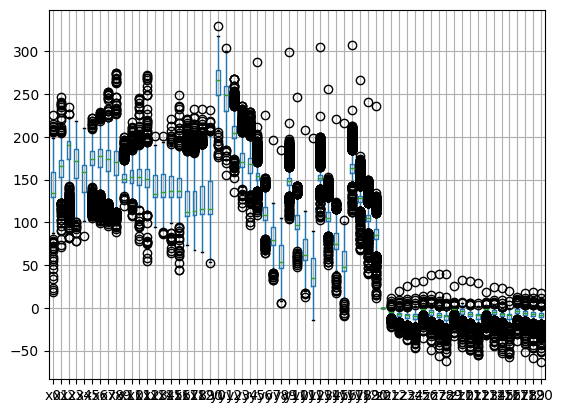

In [ ]:
import matplotlib.pyplot as plt

# Create boxplots for each column
A.boxplot(column=['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10',
       'x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20',
       'y0', 'y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'y7', 'y8', 'y9', 'y10',
       'y11', 'y12', 'y13', 'y14', 'y15', 'y16', 'y17', 'y18', 'y19', 'y20',
        'z0', 'z1', 'z2', 'z3', 'z4', 'z5', 'z6', 'z7', 'z8', 'z9', 'z10','z11', 'z12', 'z13', 'z14', 'z15', 'z16', 'z17', 'z18', 'z19', 'z20'
       ])
plt.show()


###IQR

In [ ]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = A.quantile(0.25)
Q3 = A.quantile(0.75)
IQR = Q3 - Q1

# Define outliers as values below Q1 - 1.5*IQR or above Q3 + 1.5*IQR
outliers = (A < (Q1 - 1.5 * IQR)) | (A > (Q3 + 1.5 * IQR))


Outliers in the DataFrame:
1582

Rows with outliers:
        x0   x1   x2   x3   x4   x5   x6   x7   x8   x9  ...  z11  z12  z13  \
1508   133  163  194  193  173  174  179  177  174  152  ...   -8  -11   -3   
1509   126  162  196  191  165  177  180  177  174  152  ...  -15  -18   -5   
1517   169  201  214  196  169  222  228  230  231  200  ...  -12  -15   -6   
1520   126  162  196  193  167  176  180  177  174  151  ...  -15  -18   -5   
1521   161  193  201  164  132  190  182  173  164  162  ...   -7   -9   -3   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
40027  171  129  109  130  165  119  119  120  123  145  ...   -4   -6   -2   
40030  166  130  111  129  159  125  126  128  131  147  ...   -6   -8   -4   
40031  166  129  110  129  160  119  119  121  124  144  ...   -9  -12   -6   
40034  139  176  189  180  151  165  164  161  156  149  ...    0   -1    0   
40035  164  130  122  151  183  112  110  110  110  139  ...    5    5    7   

<ipython-input-265-75e51f6672d8>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  A["out"]=outliers.any(axis=1)
<ipython-input-265-75e51f6672d8>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_A.drop("out",axis=1,inplace=True)


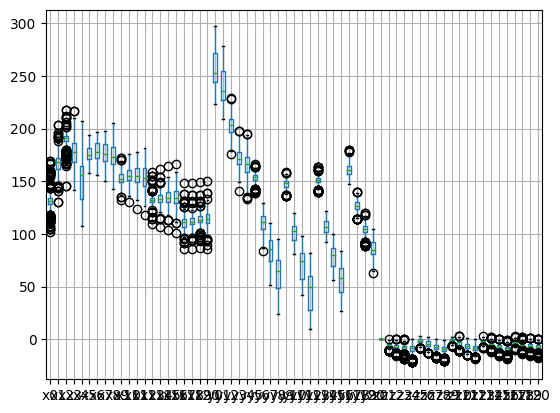

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,z11,z12,z13,z14,z15,z16,z17,z18,z19,z20
count,781.000000,781.000000,781.00000,781.000000,781.000000,781.000000,781.000000,781.000000,781.000000,781.000000,...,781.000000,781.000000,781.000000,781.000000,781.00000,781.00000,781.000000,781.000000,781.000000,781.000000
mean,131.728553,167.485275,189.59283,175.880922,149.678617,176.208707,178.558259,176.832266,174.149808,153.153649,...,-6.453265,-8.610755,-1.957746,-4.169014,-6.71831,-8.46991,-2.997439,-4.996159,-6.012804,-6.733675
std,7.981907,7.815261,6.55573,12.867267,18.591987,7.304633,8.282248,9.614294,10.908916,5.050966,...,3.296374,3.581947,1.630481,2.373381,2.77212,3.00524,1.668715,2.327370,2.697072,2.939694
min,102.000000,130.000000,146.00000,142.000000,108.000000,158.000000,156.000000,150.000000,143.000000,132.000000,...,-15.000000,-19.000000,-8.000000,-12.000000,-16.00000,-19.00000,-10.000000,-14.000000,-16.000000,-18.000000
25%,128.000000,162.000000,188.00000,168.000000,133.000000,171.000000,172.000000,169.000000,166.000000,149.000000,...,-8.000000,-10.000000,-3.000000,-5.000000,-8.00000,-10.00000,-4.000000,-6.000000,-7.000000,-8.000000
50%,131.000000,168.000000,191.00000,178.000000,156.000000,175.000000,178.000000,176.000000,173.000000,152.000000,...,-6.000000,-8.000000,-2.000000,-4.000000,-7.00000,-8.00000,-3.000000,-5.000000,-6.000000,-7.000000
75%,134.000000,172.000000,193.00000,186.000000,165.000000,182.000000,186.000000,185.000000,183.000000,157.000000,...,-4.000000,-6.000000,-1.000000,-3.000000,-5.00000,-7.00000,-2.000000,-4.000000,-4.000000,-5.000000
max,169.000000,203.000000,218.00000,217.000000,207.000000,194.000000,197.000000,198.000000,205.000000,172.000000,...,1.000000,0.000000,3.000000,2.000000,0.00000,-1.00000,3.000000,2.000000,1.000000,0.000000


In [ ]:

print("Outliers in the DataFrame:")
print(len(outliers))

# Show only rows with outliers
print("\nRows with outliers:")
print(A[outliers.any(axis=1)])

A["out"]=outliers.any(axis=1)

clean_A=A[A['out'] == False]
clean_A.drop("out",axis=1,inplace=True)
#print("\nClean data:")
clean_A.head()

# Create boxplots for each column
clean_A.boxplot(column=['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10',
       'x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20',
       'y0', 'y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'y7', 'y8', 'y9', 'y10',
       'y11', 'y12', 'y13', 'y14', 'y15', 'y16', 'y17', 'y18', 'y19', 'y20',
       'z0', 'z1', 'z2', 'z3', 'z4', 'z5', 'z6', 'z7', 'z8', 'z9', 'z10','z11', 'z12', 'z13', 'z14', 'z15', 'z16', 'z17', 'z18', 'z19', 'z20'

       ])# 'z0', 'z1', 'z2', 'z3', 'z4', 'z5', 'z6', 'z7', 'z8', 'z9', 'z10','z11', 'z12', 'z13', 'z14', 'z15', 'z16', 'z17', 'z18', 'z19', 'z20'
plt.show()
clean_A.describe()

###Iso

In [ ]:
from sklearn.ensemble import IsolationForest

# 'contamination' defines the proportion of outliers you expect in the data
iso_forest = IsolationForest(contamination=0.1, random_state=42,n_estimators=200,max_samples=512)

# Fit the model and predict
A['outlier'] = iso_forest.fit_predict(A[['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10',
       'x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20',
       'y0', 'y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'y7', 'y8', 'y9', 'y10',
       'y11', 'y12', 'y13', 'y14', 'y15', 'y16', 'y17', 'y18', 'y19', 'y20',
       'z0', 'z1', 'z2', 'z3', 'z4', 'z5', 'z6', 'z7', 'z8', 'z9', 'z10',
       'z11', 'z12', 'z13', 'z14', 'z15', 'z16', 'z17', 'z18', 'z19', 'z20'
       ]])

# 'outlier' column contains -1 for outliers, 1 for normal data points
#print(A)

# Show only the detected outliers
outliers = A[A['outlier'] == -1]
print("\nDetected outliers:")
print(len(outliers))

clean_a=A[A['outlier'] == 1]
print("\nClean data:")
print(len(clean_a))


Detected outliers:
159

Clean data:
1423


<ipython-input-270-79846dd9aefd>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  A['outlier'] = iso_forest.fit_predict(A[['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10',


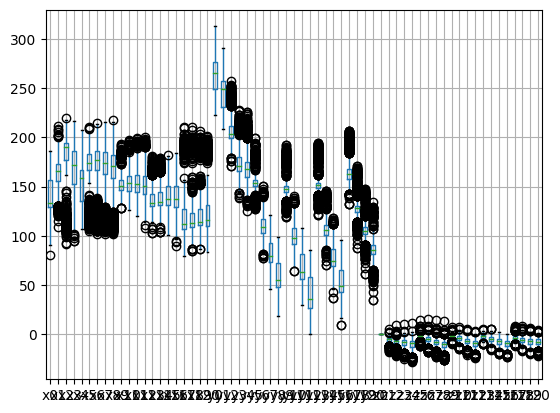

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,z12,z13,z14,z15,z16,z17,z18,z19,z20,outlier
count,1423.000000,1423.000000,1423.000000,1423.000000,1423.000000,1423.000000,1423.000000,1423.000000,1423.000000,1423.000000,...,1423.000000,1423.000000,1423.000000,1423.000000,1423.000000,1423.000000,1423.000000,1423.000000,1423.000000,1423.0
mean,140.170063,161.252284,175.465917,168.217850,153.211525,166.141251,167.715390,166.432186,164.533380,152.322558,...,-9.543921,-2.588897,-4.919185,-7.614195,-9.497540,-3.834153,-5.983837,-7.121574,-7.947997,1.0
std,16.759968,18.524482,32.714704,22.253565,20.055186,26.273989,27.982712,27.463941,26.493108,9.331485,...,4.267185,2.148906,3.024246,3.486279,3.739189,2.538710,3.204760,3.564946,3.800969,0.0
min,80.000000,109.000000,92.000000,95.000000,107.000000,105.000000,102.000000,102.000000,102.000000,128.000000,...,-24.000000,-10.000000,-16.000000,-20.000000,-23.000000,-12.000000,-17.000000,-20.000000,-22.000000,1.0
25%,129.000000,156.000000,177.000000,153.000000,135.000000,167.000000,167.000000,163.000000,159.000000,147.000000,...,-12.000000,-4.000000,-7.000000,-10.000000,-12.000000,-5.000000,-8.000000,-10.000000,-10.000000,1.0
50%,133.000000,166.000000,190.000000,172.000000,159.000000,174.000000,177.000000,174.000000,171.000000,151.000000,...,-9.000000,-2.000000,-5.000000,-7.000000,-9.000000,-4.000000,-6.000000,-7.000000,-8.000000,1.0
75%,157.000000,173.000000,194.000000,186.000000,167.000000,183.000000,186.000000,185.000000,182.000000,157.000000,...,-7.000000,-1.000000,-3.000000,-5.000000,-7.000000,-2.000000,-4.000000,-5.000000,-5.500000,1.0
max,186.000000,212.000000,220.000000,217.000000,208.000000,211.000000,215.000000,216.000000,218.000000,193.000000,...,3.000000,5.000000,5.000000,2.000000,0.000000,8.000000,8.000000,6.000000,4.000000,1.0


In [ ]:
# Create boxplots for each column
clean_a.boxplot(column=['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10',
       'x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20',
       'y0', 'y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'y7', 'y8', 'y9', 'y10',
       'y11', 'y12', 'y13', 'y14', 'y15', 'y16', 'y17', 'y18', 'y19', 'y20',
       'z0', 'z1', 'z2', 'z3', 'z4', 'z5', 'z6', 'z7', 'z8', 'z9', 'z10',
       'z11', 'z12', 'z13', 'z14', 'z15', 'z16', 'z17', 'z18', 'z19', 'z20'
       ])
plt.show()
clean_a.describe()

##ASL_DATA_EXPLORATORY

##Using the IQR (Interquartile Range) Method

In [ ]:
# Function to remove outliers based on the IQR method
def remove_outliers_IQR(df_main,label):
    df=df_main.groupby("label").get_group(label)
    print(f"Number of eliment in {label} :",len(df))

    df=df.drop("label",axis=1)

    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    IQR = Q3 - Q1
    # Define outliers as values below Q1 - 1.5*IQR or above Q3 + 1.5*IQR
    outliers = (df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))

    # add 1 for any outlier in row and 0 for non outlier in row
    #df["outliers"]=[1 if x else 0 for x in outliers.any(axis=1)]
    df.loc[:, "outliers"] = [1 if x else 0 for x in outliers.any(axis=1)]

    df_clean=df[df['outliers'] == 0] #filter

    print(f"Number of outliers in {label} :",len(df[df['outliers'] == 1]))
    print(f"Number of Non outliers in {label} :",len(df_clean))

    df_clean=df_clean.drop("outliers",axis=1)

    #df_clean["label"]=label
    df_clean.loc[:, "label"] = label




    return df_clean

In [ ]:
t=remove_outliers_IQR(df,"A")
t.head()

Number of eliment in A : 1419
Number of outliers in A : 665
Number of Non outliers in A : 754


,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,z12,z13,z14,z15,z16,z17,z18,z19,z20,label
8517,155,189,211,203,188,170,161,168,176,142,...,-10,-2,-9,-8,-5,-4,-9,-8,-5,A
8519,132,177,209,217,214,183,189,188,186,150,...,-12,-4,-13,-11,-8,-5,-12,-11,-8,A
8522,129,172,206,213,205,179,179,175,175,149,...,-10,-1,-9,-8,-5,-2,-8,-7,-4,A
8523,134,179,212,211,202,178,176,174,175,146,...,-12,-2,-11,-10,-6,-4,-10,-8,-5,A
8524,139,183,210,208,208,179,178,181,184,149,...,-10,-1,-10,-8,-4,-3,-9,-7,-3,A


##Using Isolation Forest (Machine Learning Algorithm for Outliers):

In [ ]:
from sklearn.ensemble import IsolationForest

# Function to remove outliers based on the IQR method
def remove_outliers_ISO(df_main,label):
    df=df_main.groupby("label").get_group(label)
    print(f"Number of eliment in {label} :",len(df))

    df=df.drop("label",axis=1)

    # 'contamination' defines the proportion of outliers you expect in the data
    iso_forest = IsolationForest(contamination=0.2, random_state=42,n_estimators=200,max_samples=512)
    df['outliers'] = iso_forest.fit_predict(df)
    # 'outlier' column contains -1 for outliers, 1 for normal data points

    # Show only the detected outliers

    # add 1 for any outlier in row and 0 for non outlier in row

    df_clean=df[df['outliers'] == 1] #filter

    print(f"Number of outliers in {label} :",len(df[df['outliers'] == -1]))
    print(f"Number of Non outliers in {label} :",len(df_clean))

    df_clean=df_clean.drop("outliers",axis=1)

    #df_clean["label"]=label
    df_clean.loc[:, "label"] = label




    return df_clean

In [ ]:
s=remove_outliers_ISO(df,"A")
s.head()

Number of eliment in A : 1419
Number of outliers in A : 284
Number of Non outliers in A : 1135


,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,z12,z13,z14,z15,z16,z17,z18,z19,z20,label
8517,155,189,211,203,188,170,161,168,176,142,...,-10,-2,-9,-8,-5,-4,-9,-8,-5,A
8518,175,220,244,249,249,221,224,224,225,191,...,-9,-1,-9,-9,-5,-3,-10,-9,-6,A
8519,132,177,209,217,214,183,189,188,186,150,...,-12,-4,-13,-11,-8,-5,-12,-11,-8,A
8520,129,178,213,218,214,181,198,197,192,150,...,-9,-1,-8,-8,-6,-3,-7,-5,-2,A
8521,170,219,247,259,265,224,232,230,228,192,...,-9,-1,-10,-9,-5,-4,-11,-9,-5,A


##Main function

In [ ]:
# Function to process each class
def process_class(data_frame, class_name,value_column):
    print(f"Processing class: {class_name}")
    df=data_frame.copy()
    # Filter by class
    class_df = df[df['label'] == class_name]

    # Show boxplot before removing outliers
    plt.figure(figsize=(15, 10))
    sns.boxplot(data=class_df[value_column])
    plt.title(f'Boxplot Before Removing Outliers - Class {class_name}')
    plt.show()

    # Remove outliers
    #class_df_no_outliers = remove_outliers_IQR(df_main=df,label=class_name)
    class_df_no_outliers =remove_outliers_ISO(df_main=df,label=class_name)

    # Show boxplot after removing outliers
    plt.figure(figsize=(15, 10))
    sns.boxplot(data=class_df_no_outliers[value_column])
    plt.title(f'Boxplot After Removing Outliers - Class {class_name}')
    plt.show()

    return class_df_no_outliers

# Example usage with a DataFrame
def main_exploratory(data_frame):
    # Load your dataset
    # Assuming 'Class' is the column containing class labels, and 'Value' is the column you want to check for outliers
    #df = pd.read_csv('your_dataset.csv')  # Replace with your dataset

    # List of classes to process
    classes = data_frame['label'].unique()
    Value=['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10',
       'x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20',
       'y0', 'y1', 'y2', 'y3', 'y4', 'y5', 'y6', 'y7', 'y8', 'y9', 'y10',
       'y11', 'y12', 'y13', 'y14', 'y15', 'y16', 'y17', 'y18', 'y19', 'y20',
        'z0', 'z1', 'z2', 'z3', 'z4', 'z5', 'z6', 'z7', 'z8', 'z9', 'z10','z11', 'z12', 'z13', 'z14', 'z15', 'z16', 'z17', 'z18', 'z19', 'z20'
       ]
    # Process each class and store the cleaned data
    cleaned_data = pd.DataFrame()
    for class_name in classes:
        cleaned_class_df = process_class(data_frame, class_name,Value)  # Replace 'Value' with the actual column name
        cleaned_data = pd.concat([cleaned_data,cleaned_class_df],axis=0,ignore_index=True)

    print(cleaned_data.describe(include="all"))
    # Save the cleaned dataset
    cleaned_data.to_csv('ASL_cleaned_ISO_dataset.csv', index=False)


In [ ]:
outliers_IQR=main_exploratory(df)

Output hidden; open in https://colab.research.google.com to view.

Processing class: N


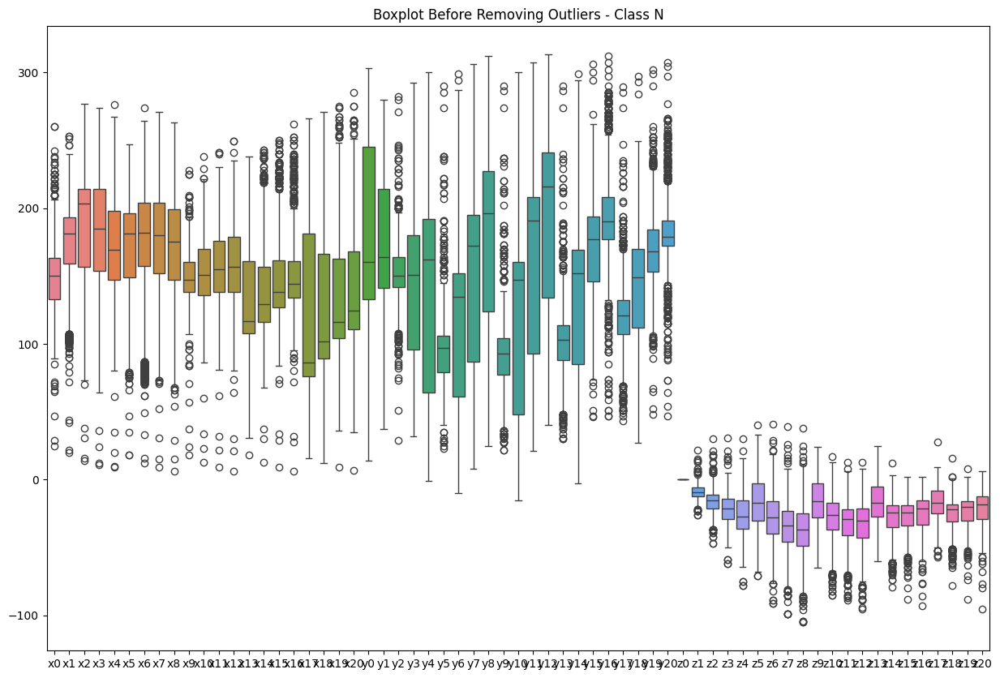

Number of eliment in N : 1486
Number of outliers in N : 297
Number of Non outliers in N : 1189


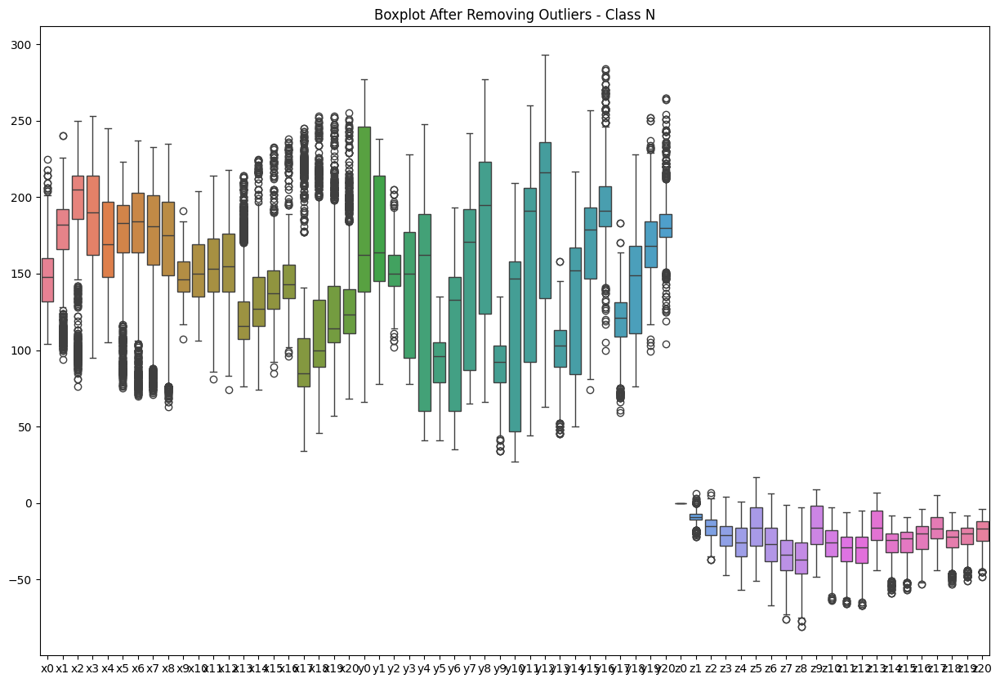

Processing class: R


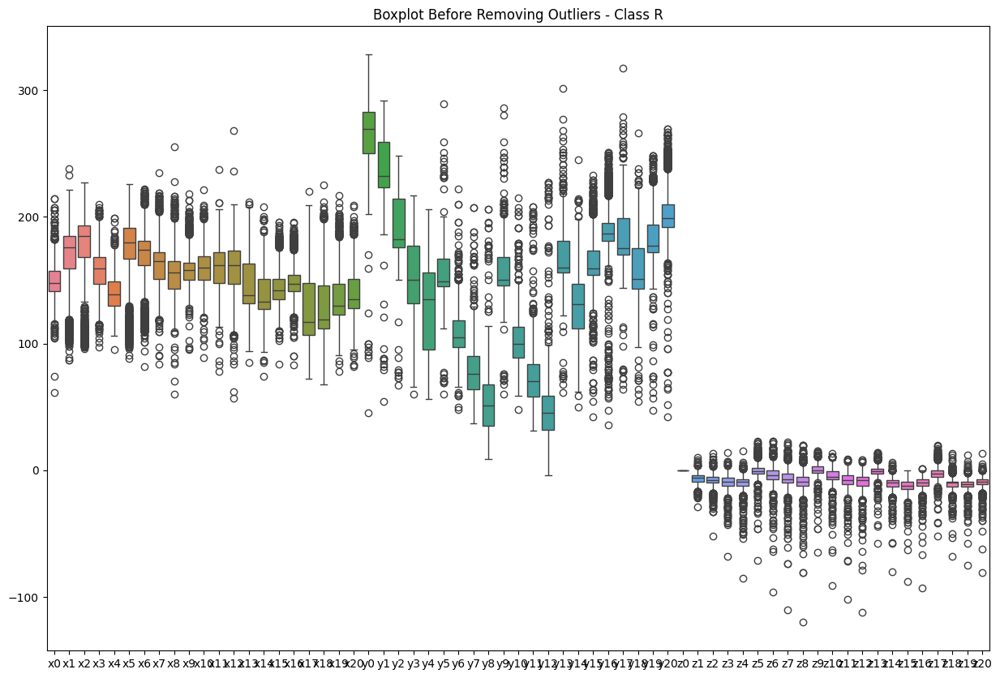

Number of eliment in R : 1585
Number of outliers in R : 317
Number of Non outliers in R : 1268


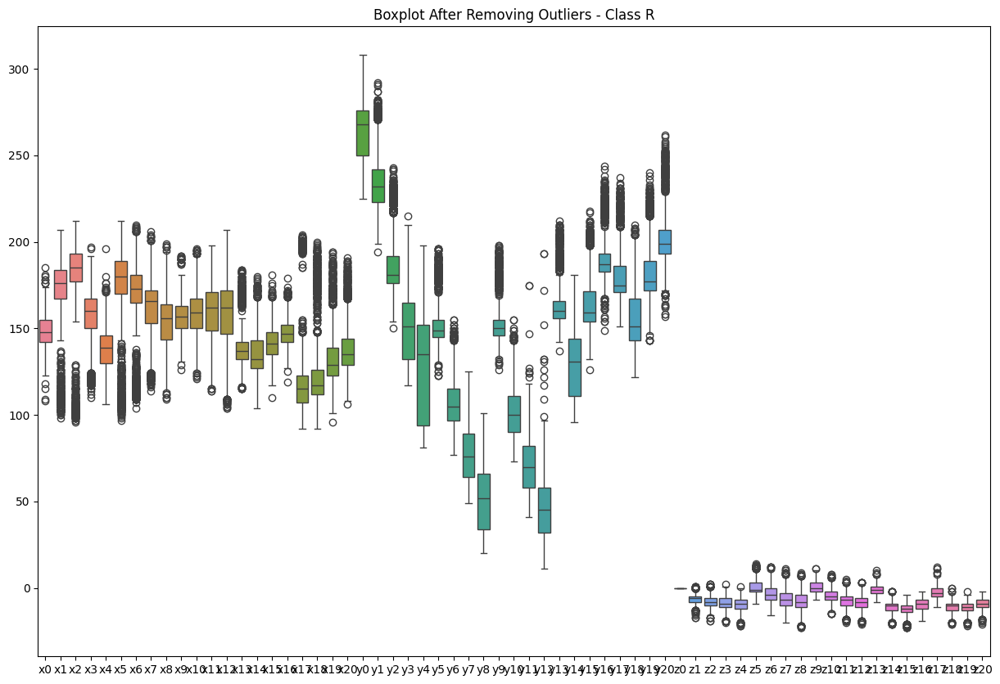

Processing class: SPACE


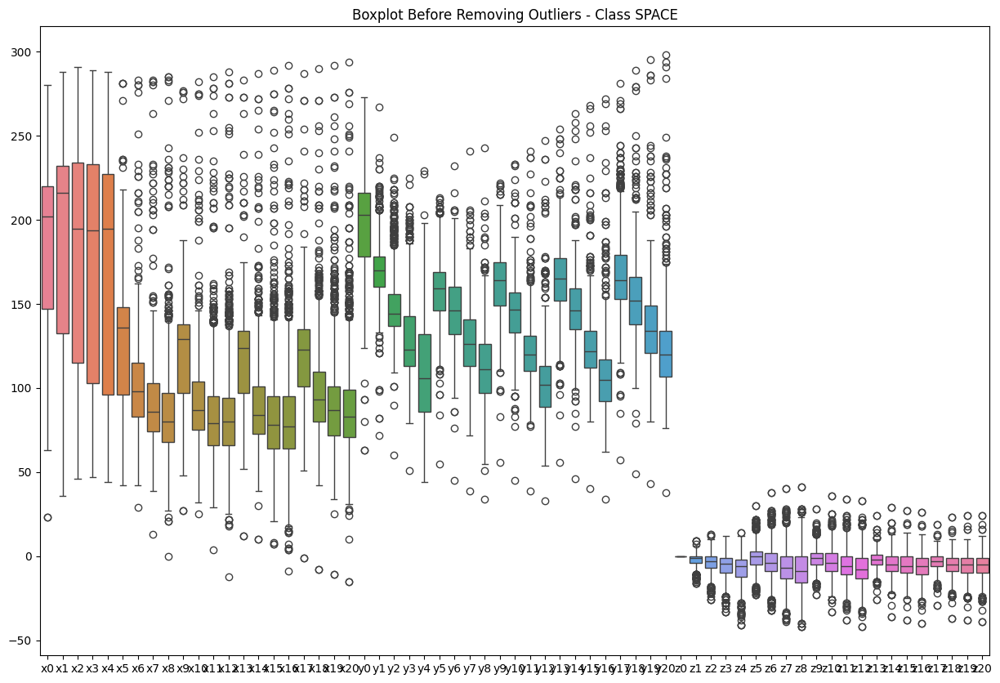

Number of eliment in SPACE : 1002
Number of outliers in SPACE : 201
Number of Non outliers in SPACE : 801


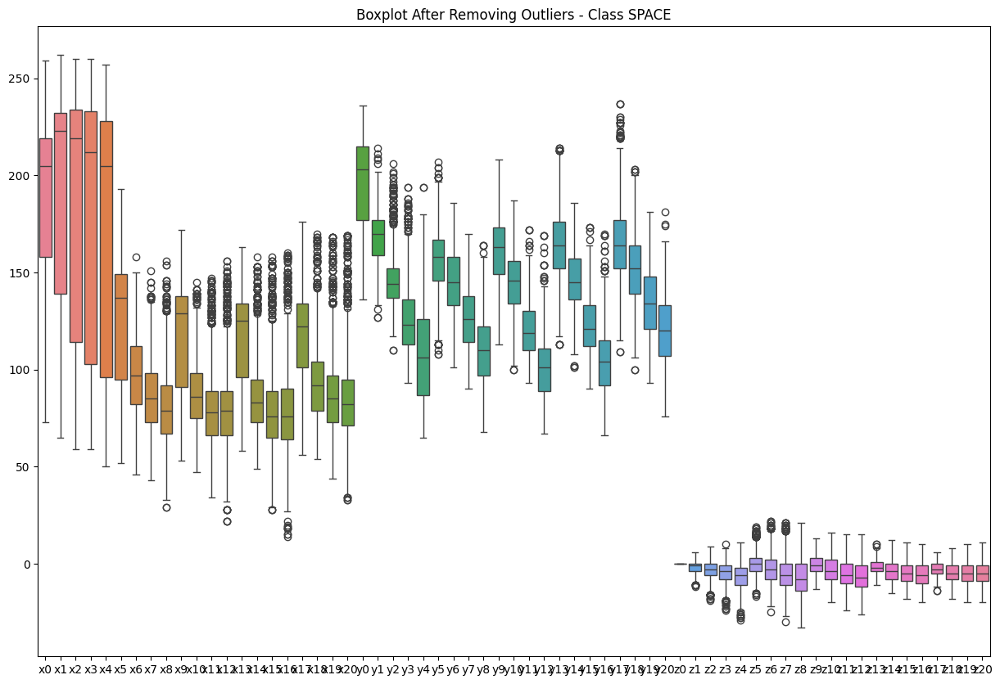

Processing class: B


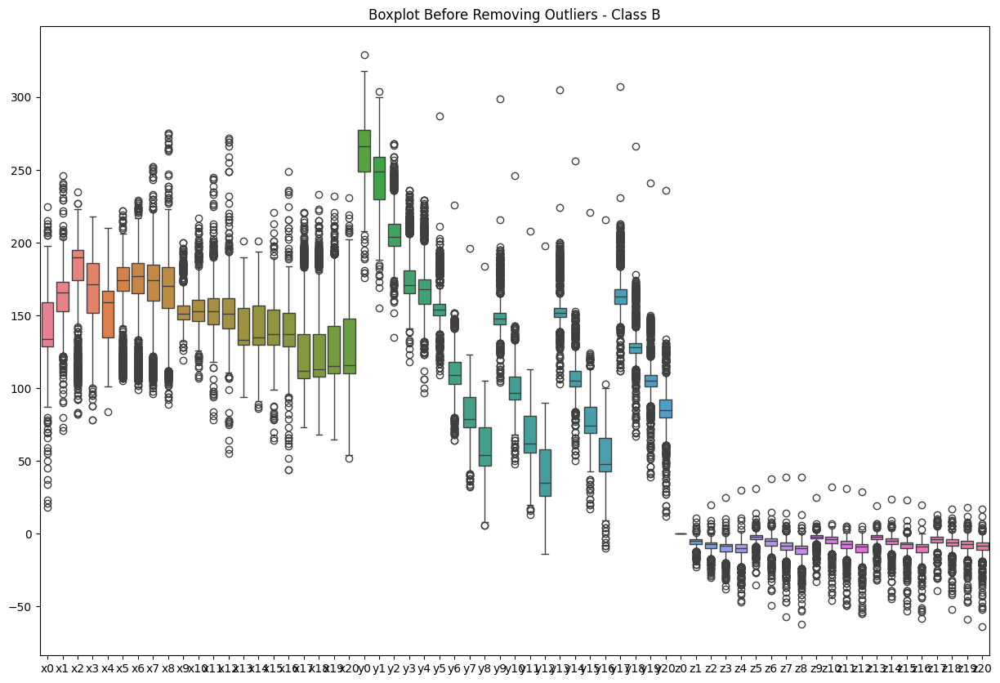

Number of eliment in B : 1582
Number of outliers in B : 316
Number of Non outliers in B : 1266


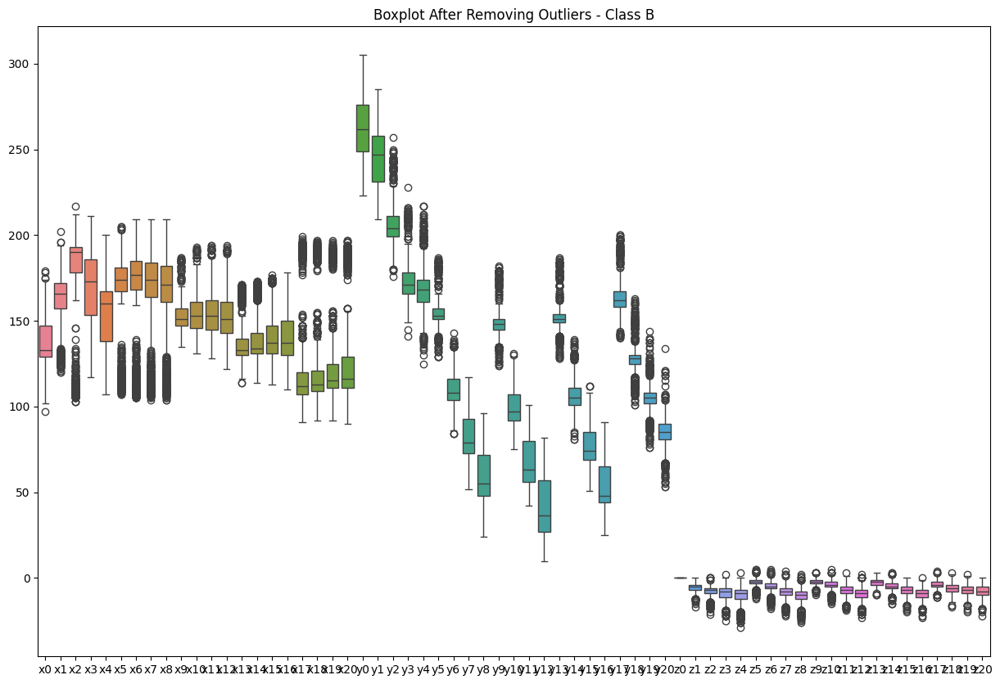

Processing class: I


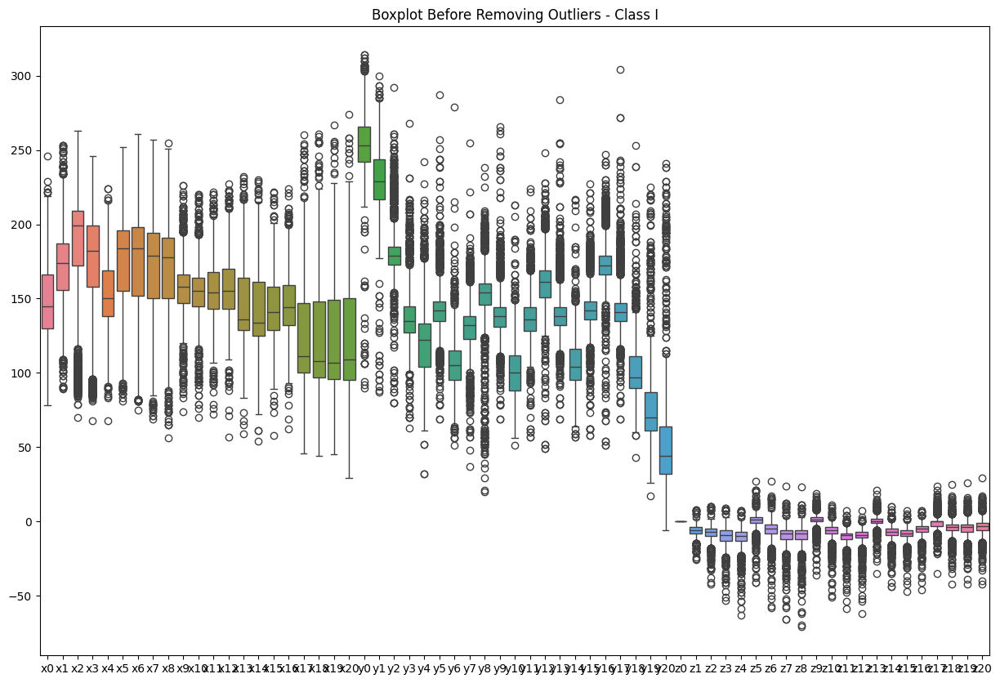

Number of eliment in I : 1569
Number of outliers in I : 314
Number of Non outliers in I : 1255


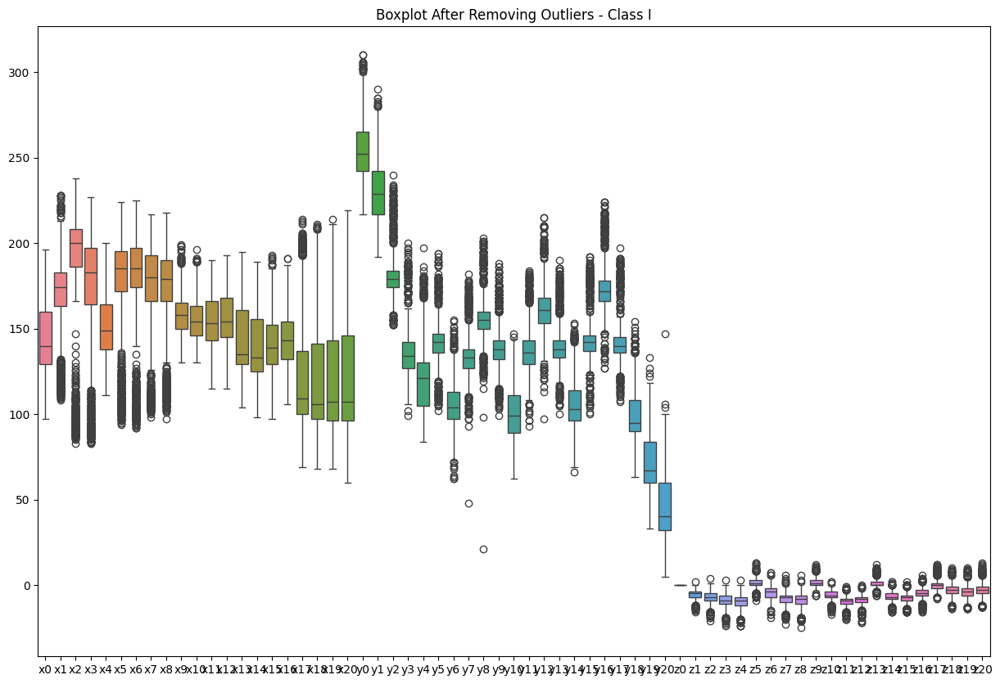

Processing class: DEL


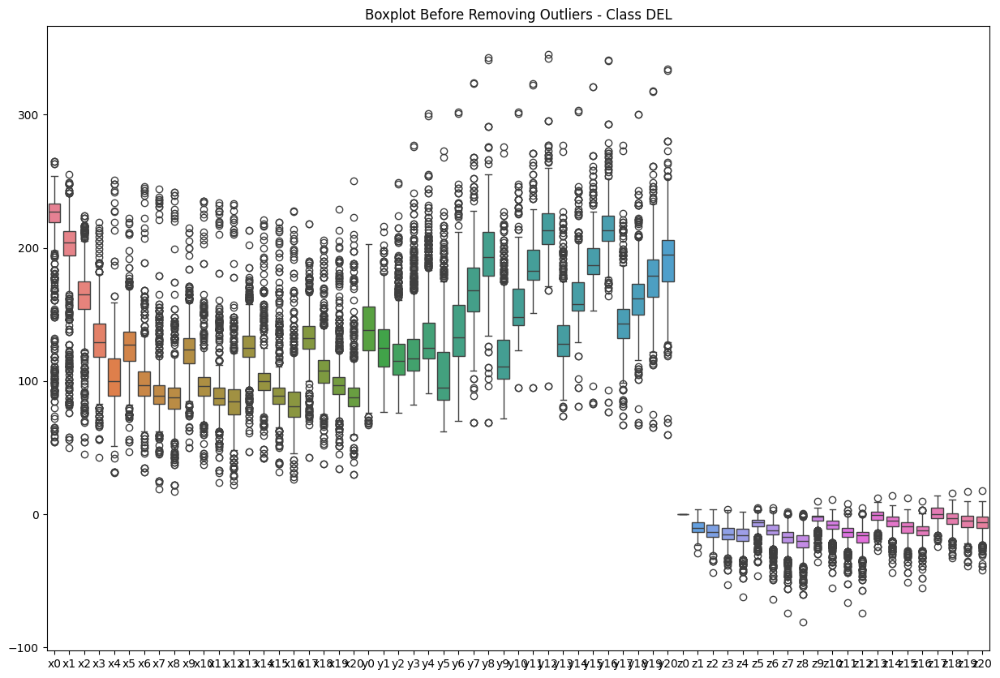

Number of eliment in DEL : 1002
Number of outliers in DEL : 201
Number of Non outliers in DEL : 801


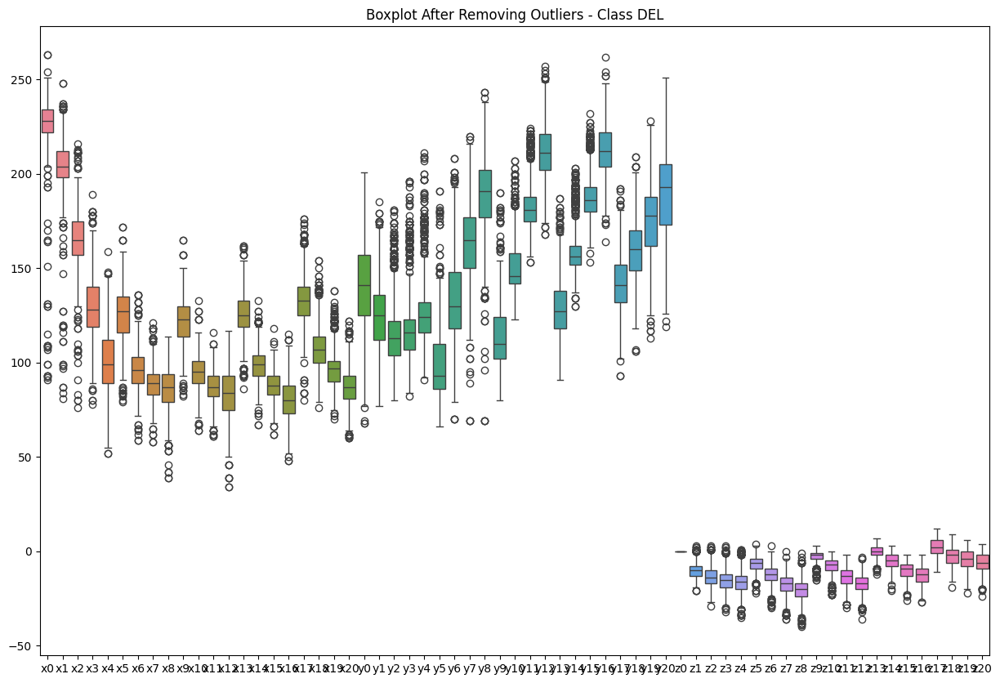

Processing class: F


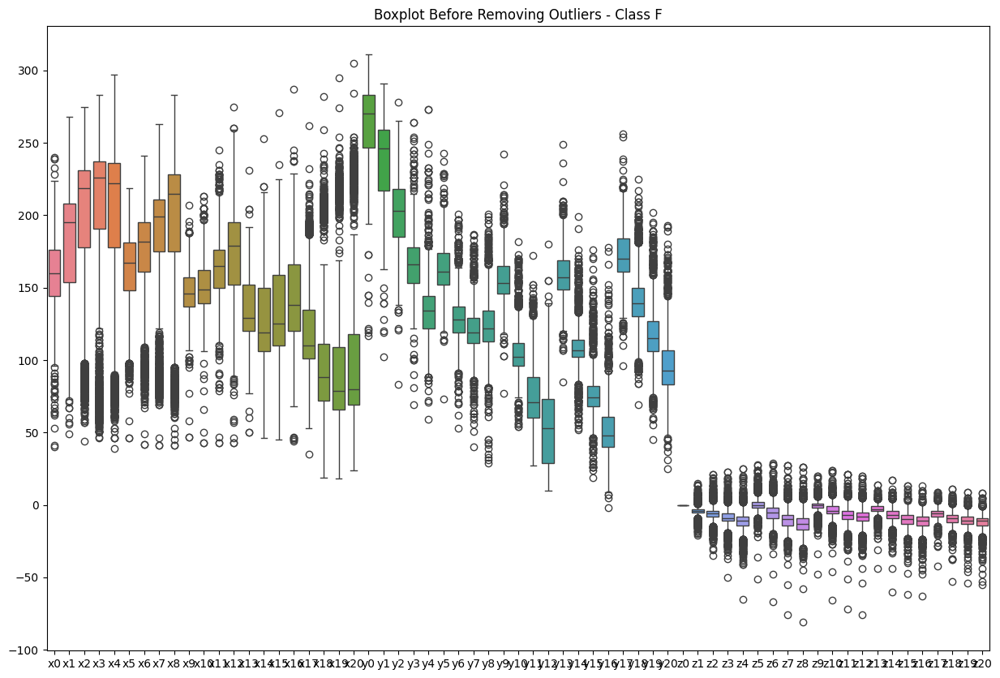

Number of eliment in F : 1589
Number of outliers in F : 318
Number of Non outliers in F : 1271


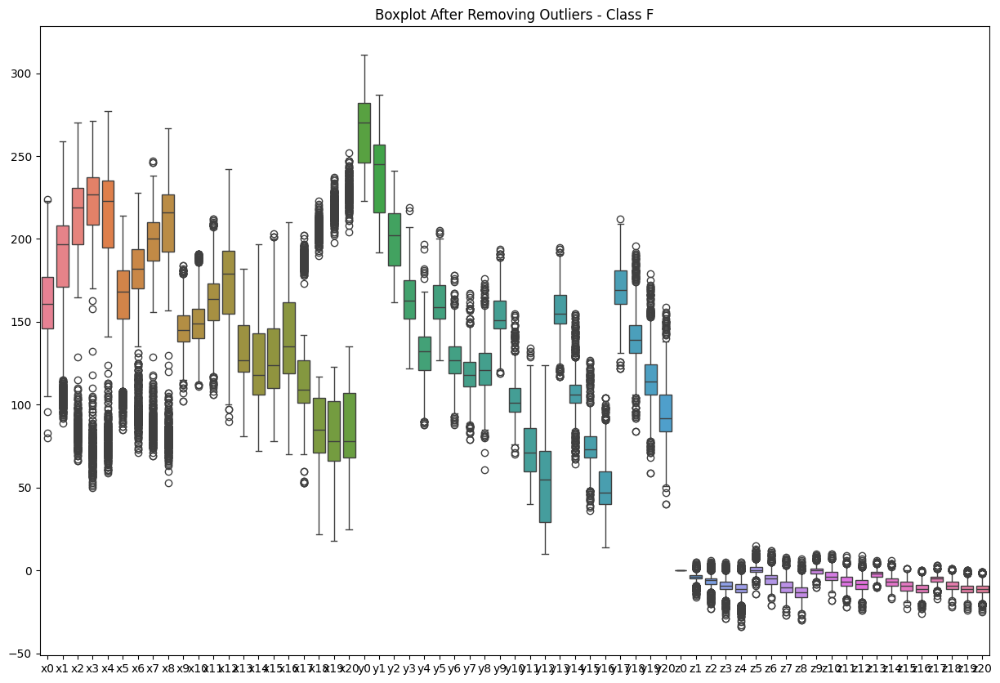

Processing class: H


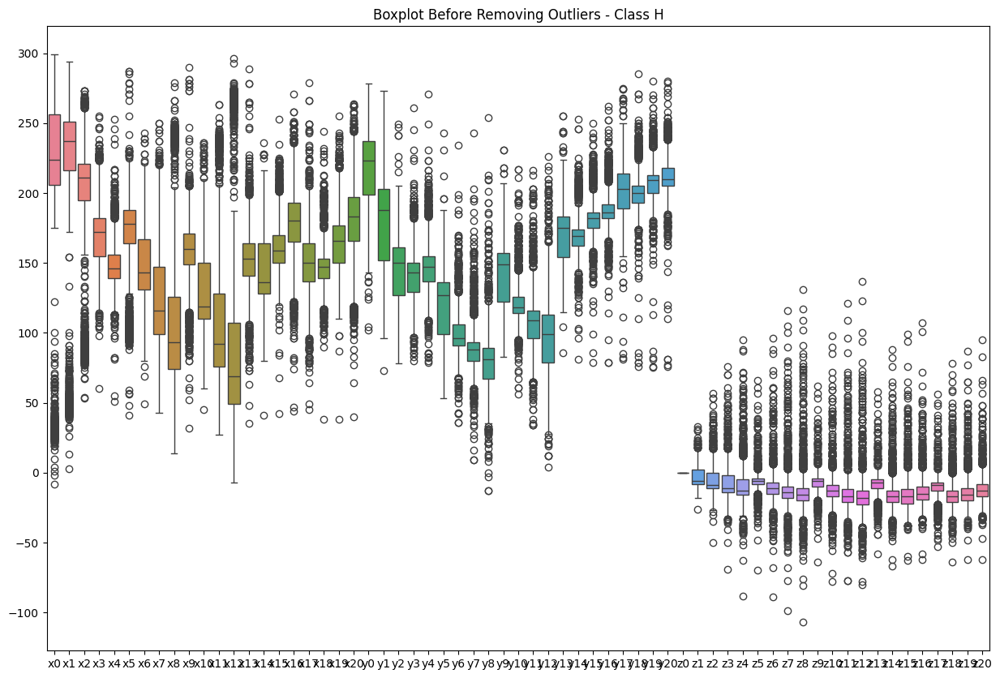

Number of eliment in H : 1593
Number of outliers in H : 319
Number of Non outliers in H : 1274


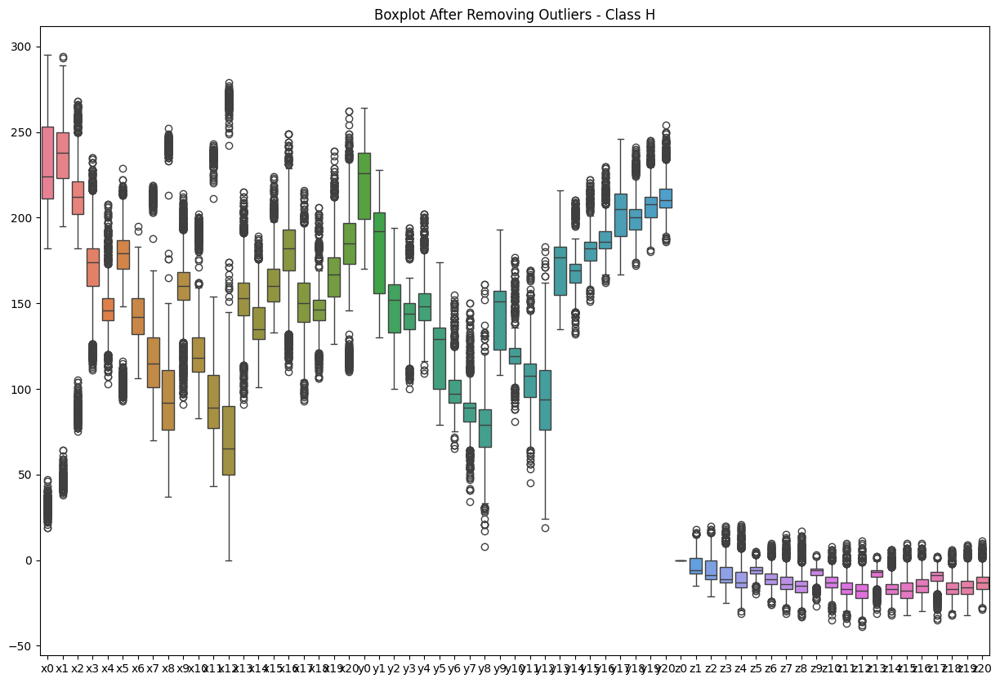

Processing class: E


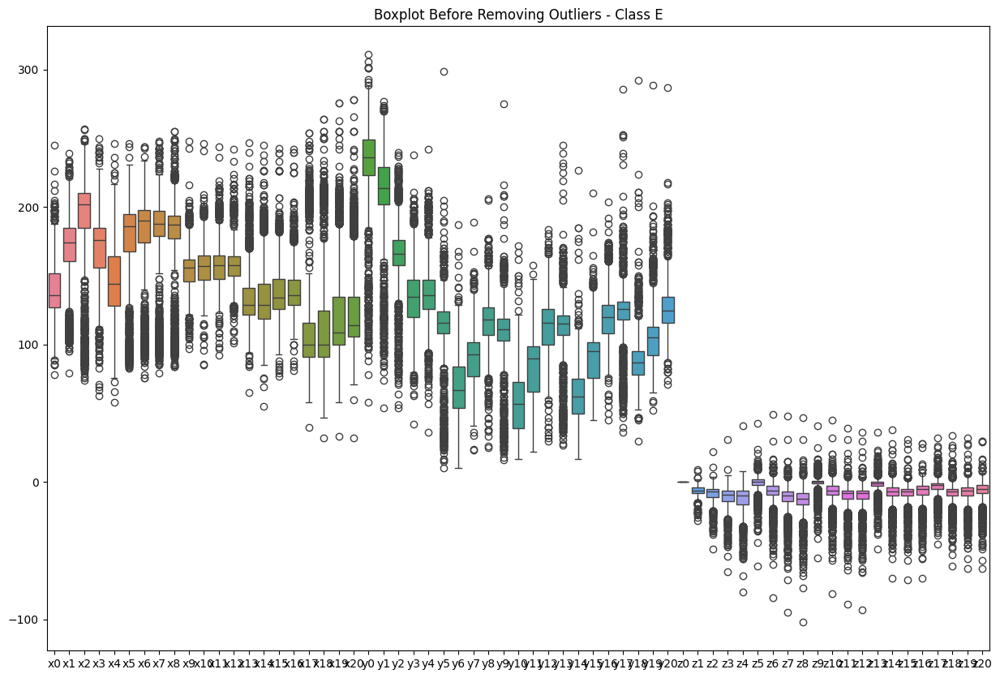

Number of eliment in E : 1561
Number of outliers in E : 311
Number of Non outliers in E : 1250


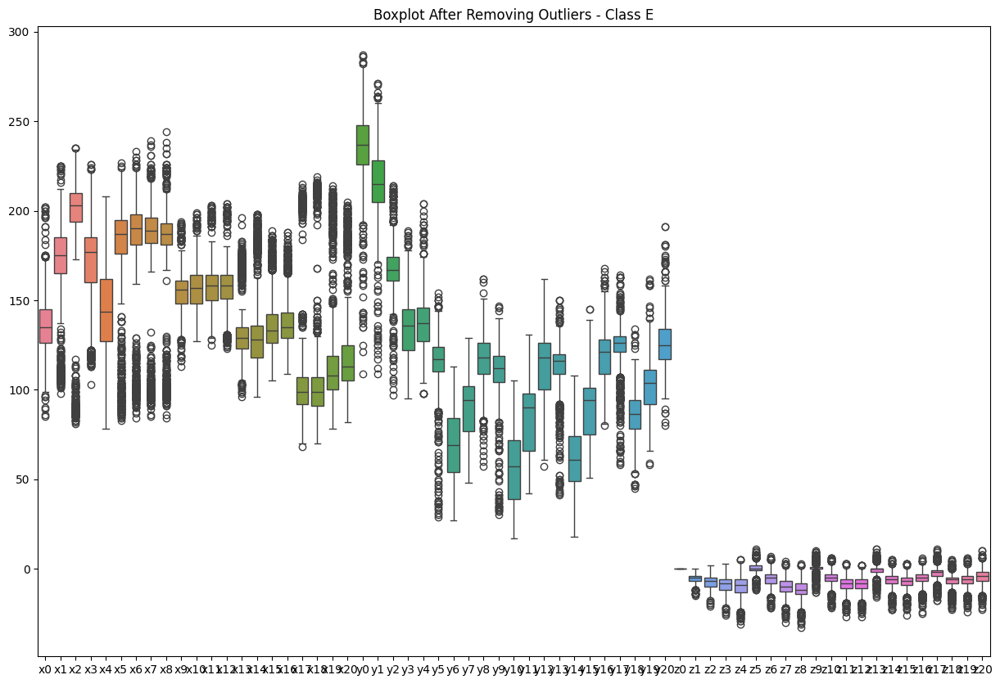

Processing class: U


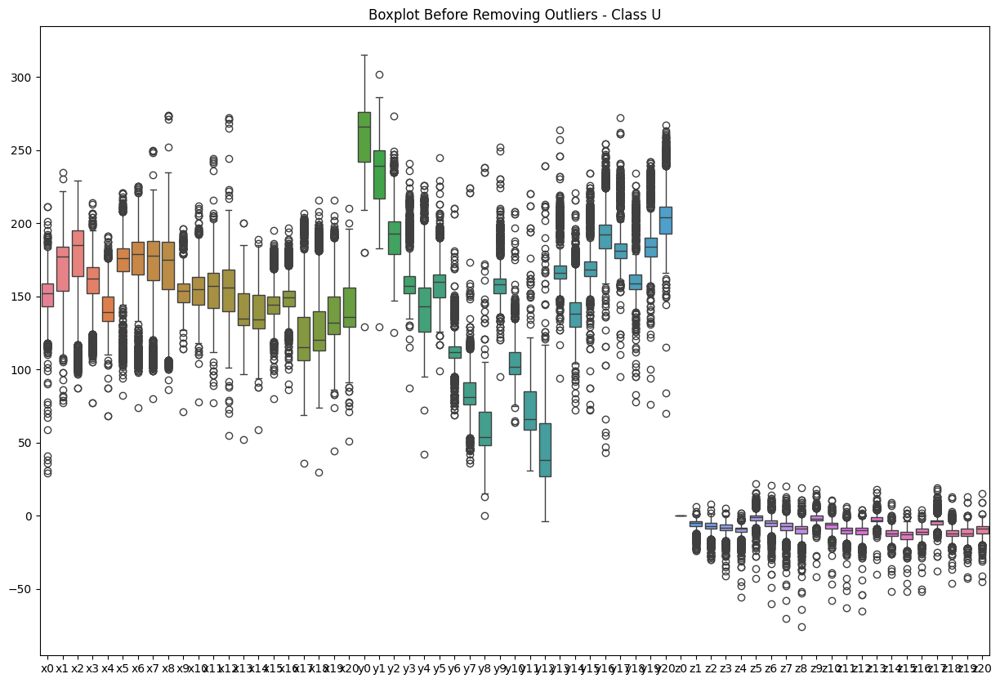

Number of eliment in U : 1577
Number of outliers in U : 316
Number of Non outliers in U : 1261


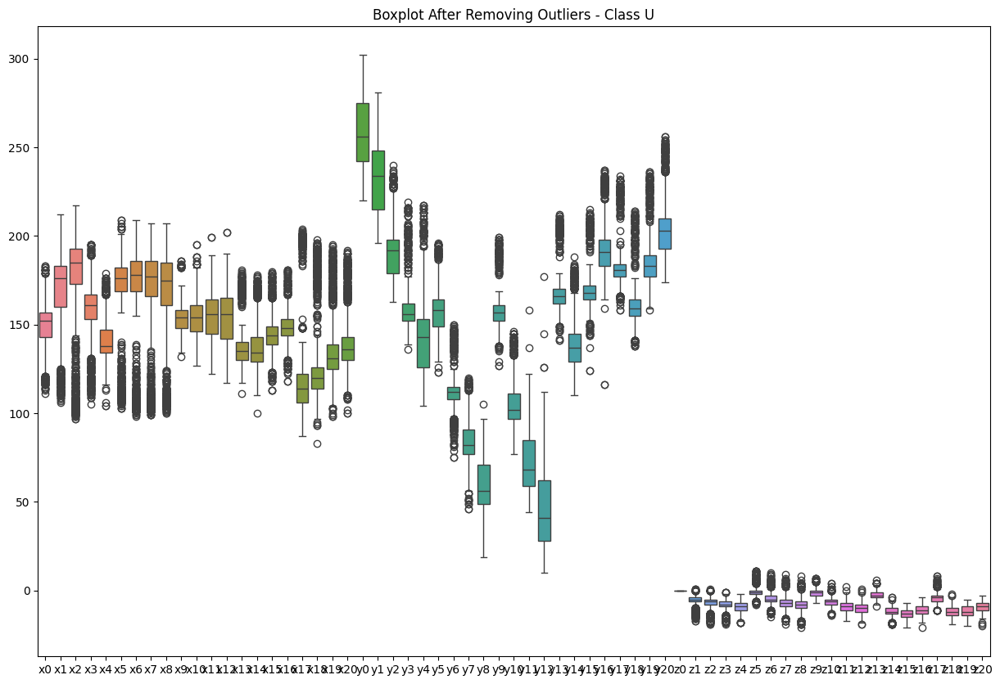

Processing class: M


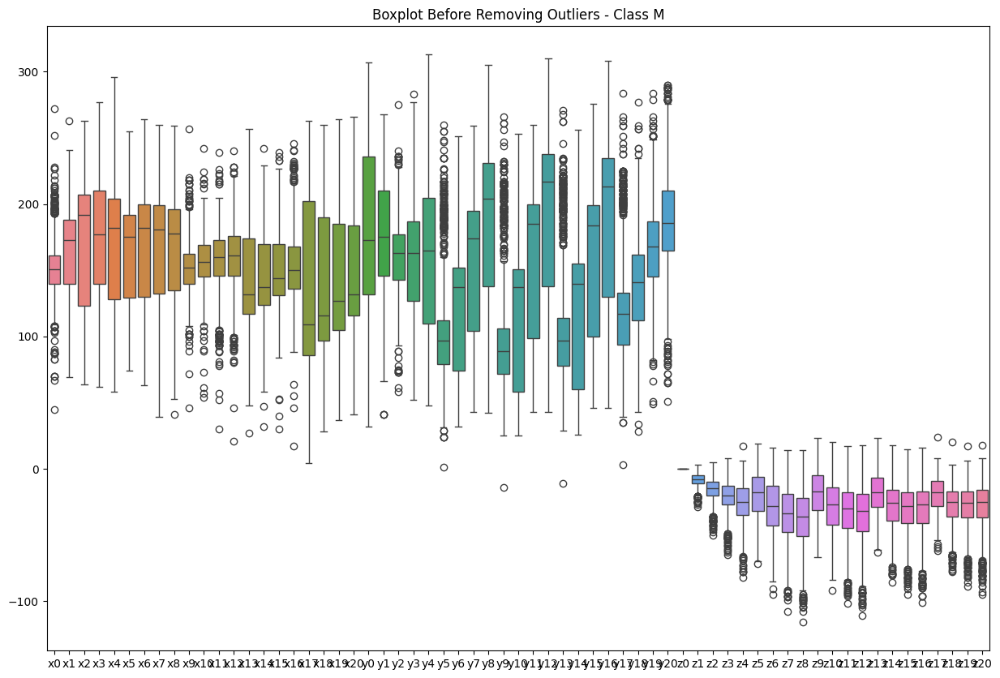

Number of eliment in M : 1323
Number of outliers in M : 264
Number of Non outliers in M : 1059


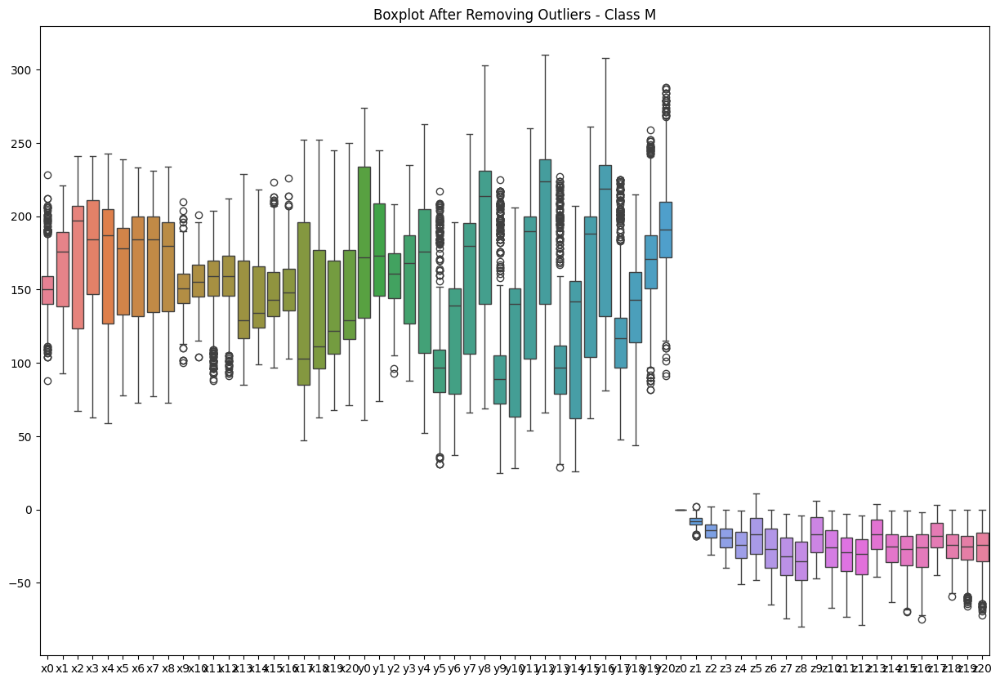

Processing class: X


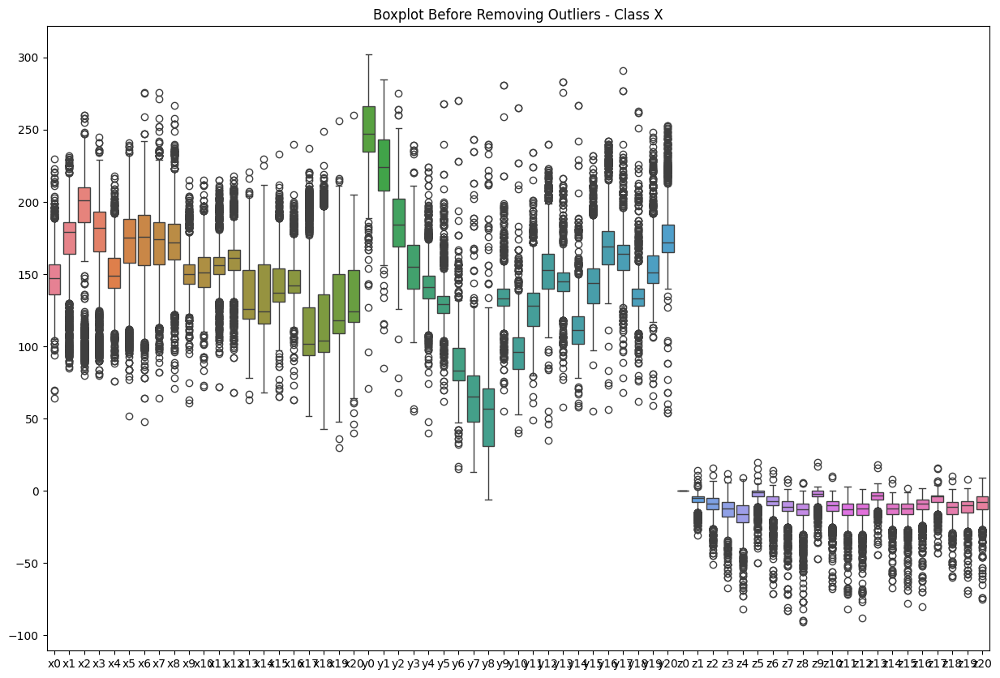

Number of eliment in X : 1567
Number of outliers in X : 314
Number of Non outliers in X : 1253


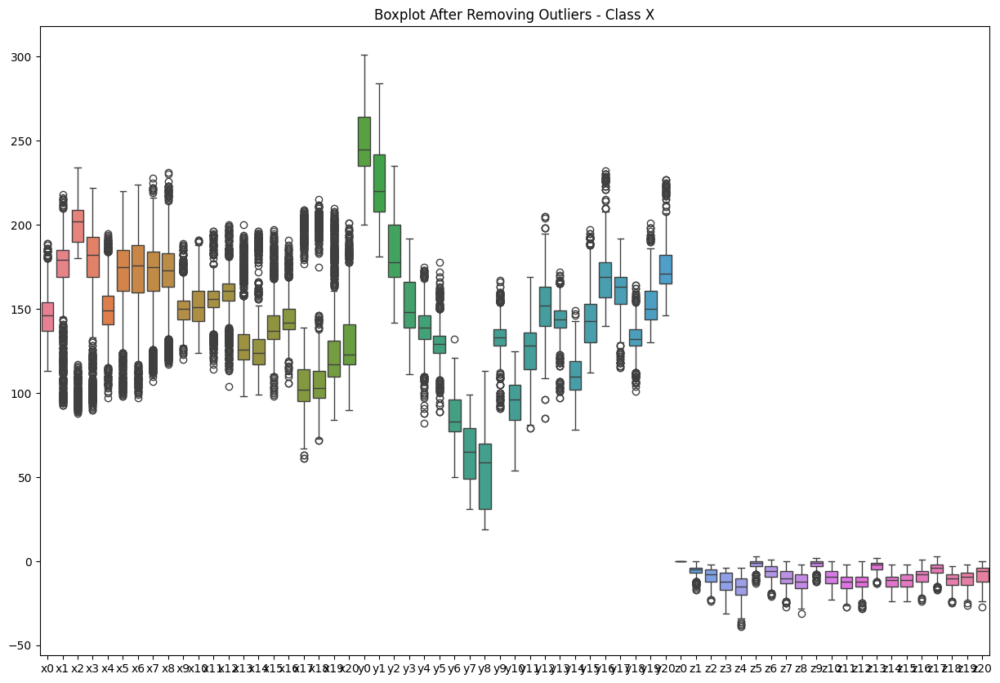

Processing class: K


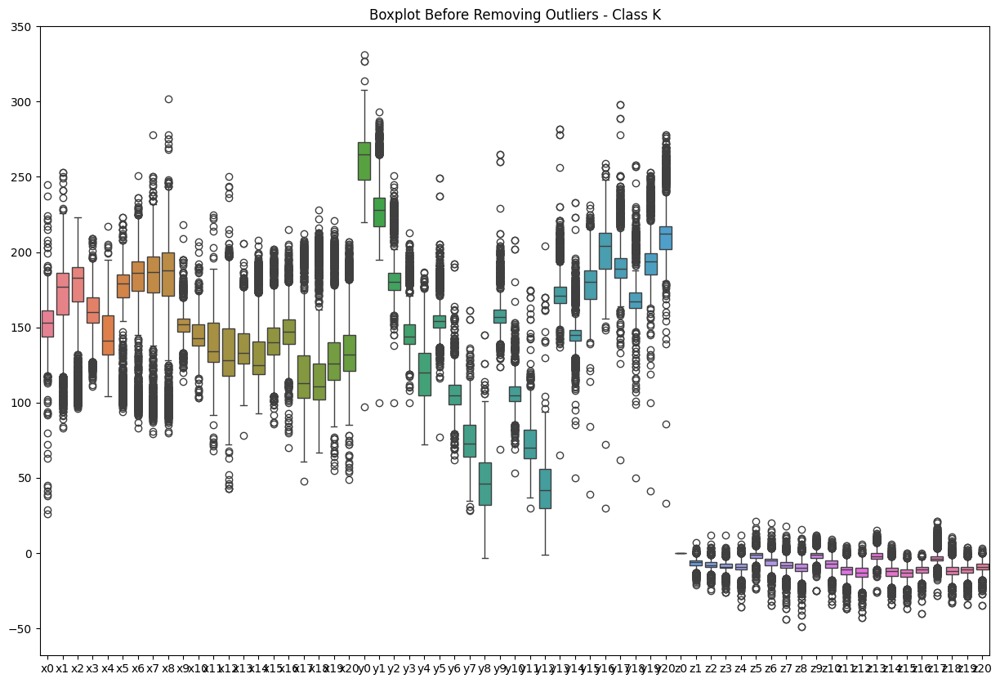

Number of eliment in K : 1591
Number of outliers in K : 318
Number of Non outliers in K : 1273


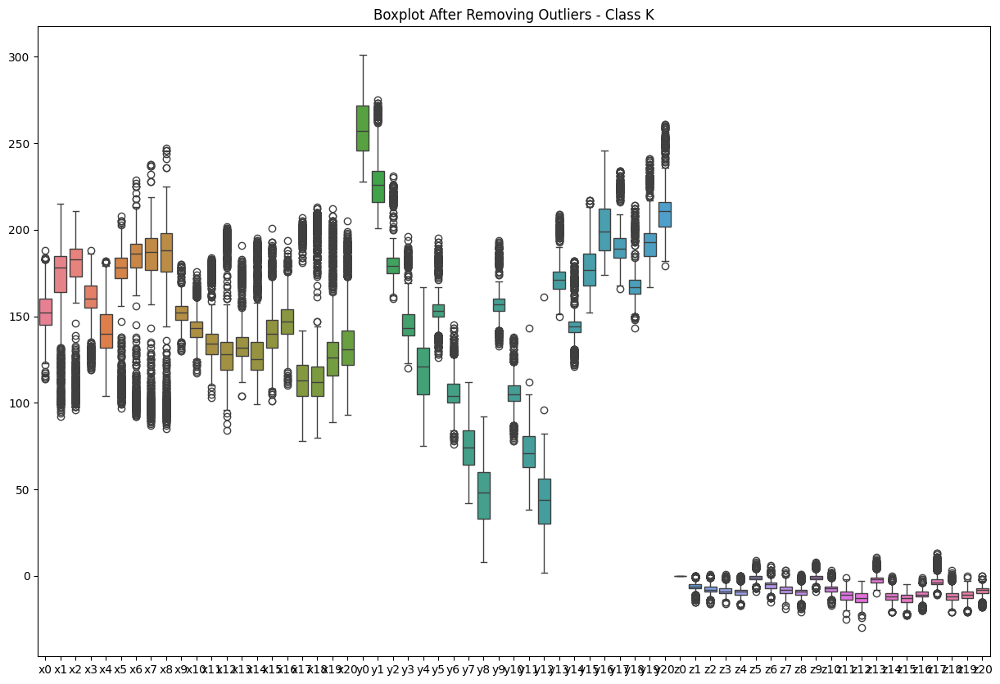

Processing class: Q


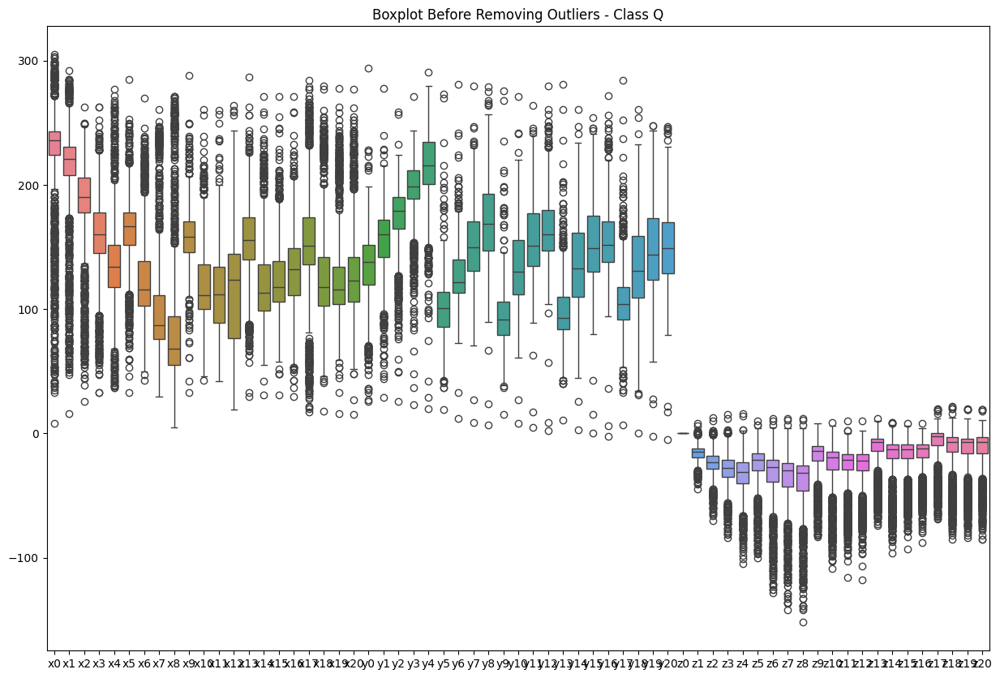

Number of eliment in Q : 1318
Number of outliers in Q : 264
Number of Non outliers in Q : 1054


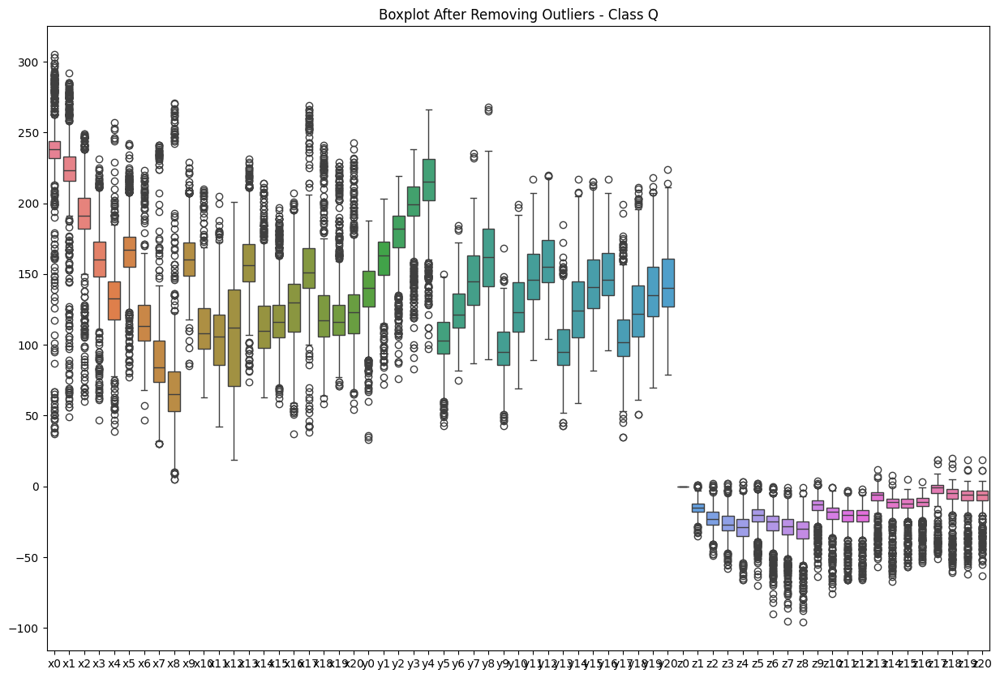

Processing class: Y


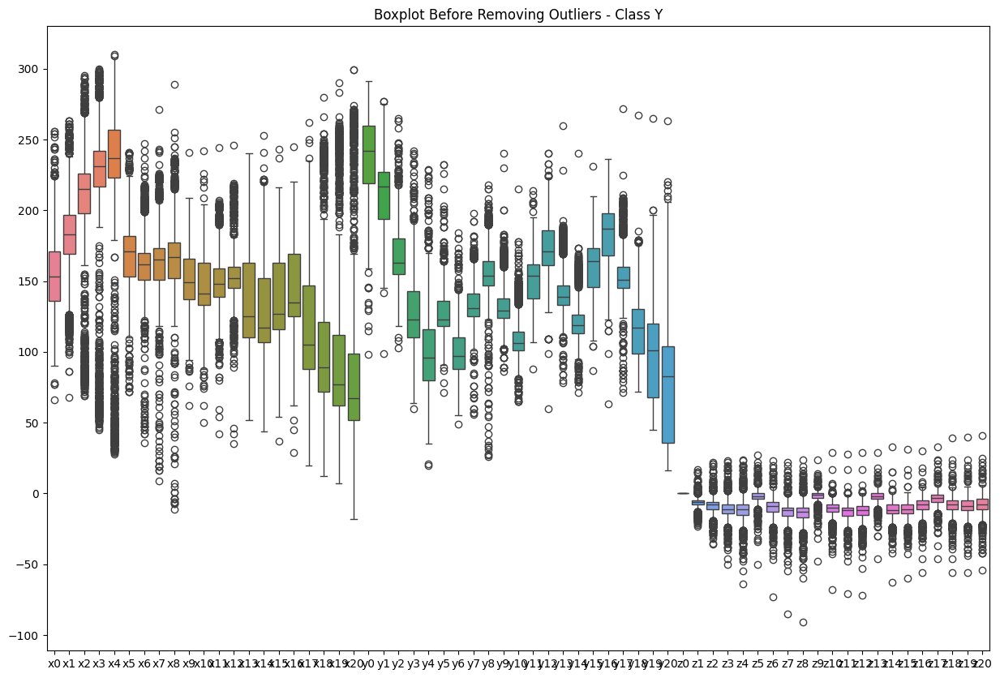

Number of eliment in Y : 1473
Number of outliers in Y : 295
Number of Non outliers in Y : 1178


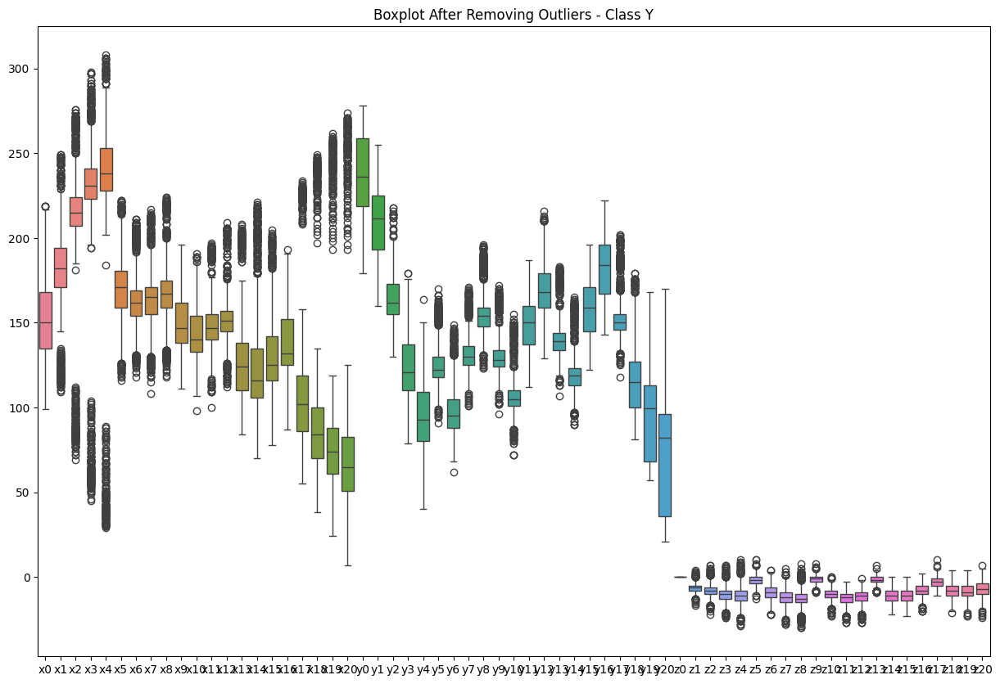

Processing class: S


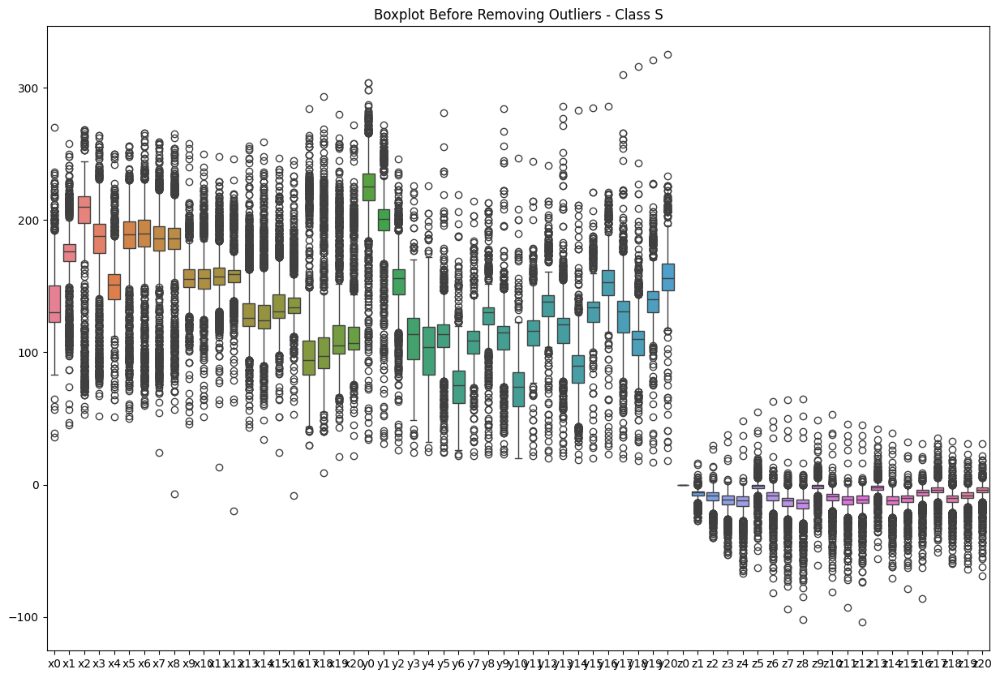

Number of eliment in S : 1328
Number of outliers in S : 266
Number of Non outliers in S : 1062


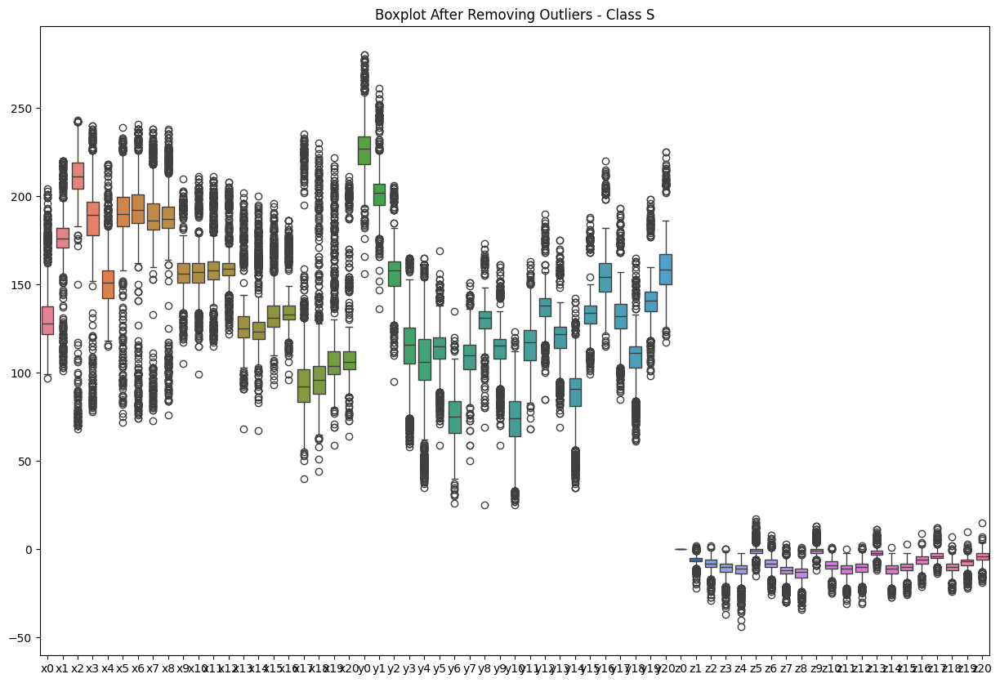

Processing class: G


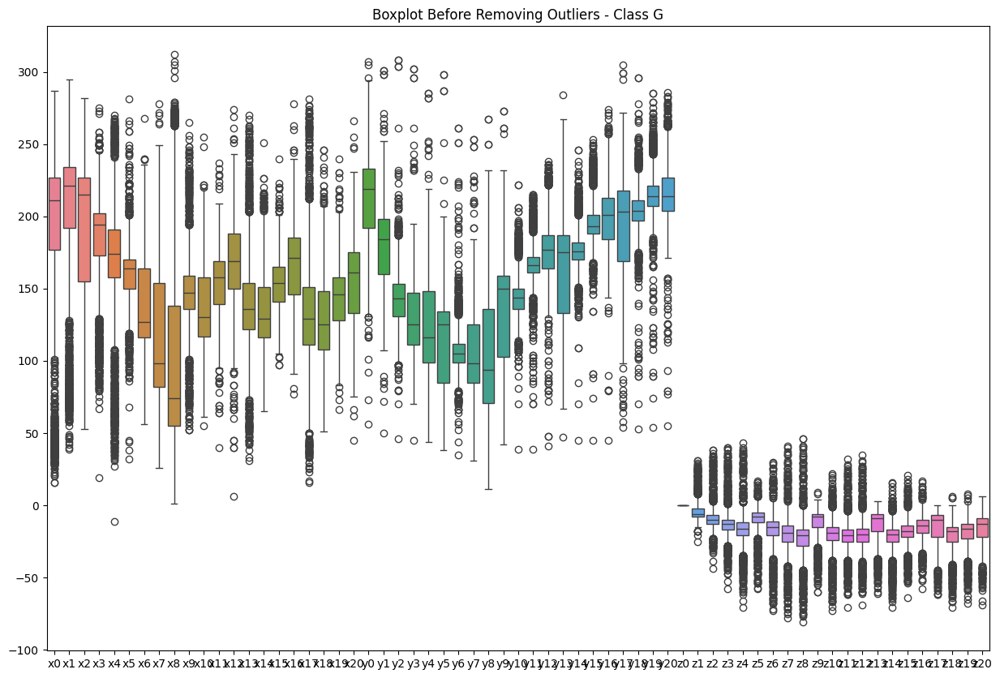

Number of eliment in G : 1589
Number of outliers in G : 318
Number of Non outliers in G : 1271


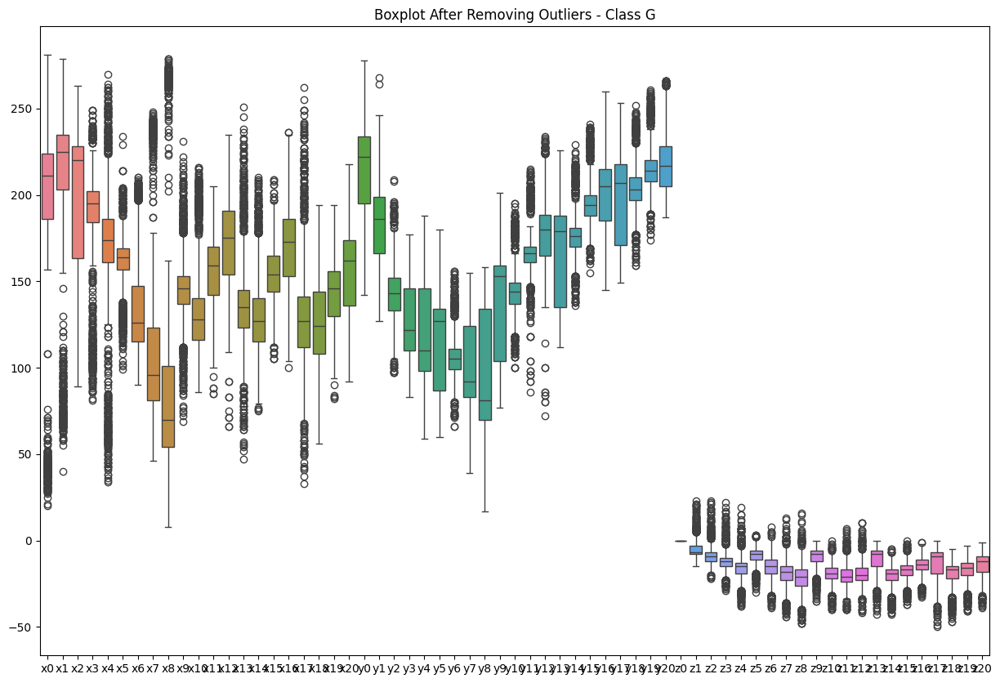

Processing class: A


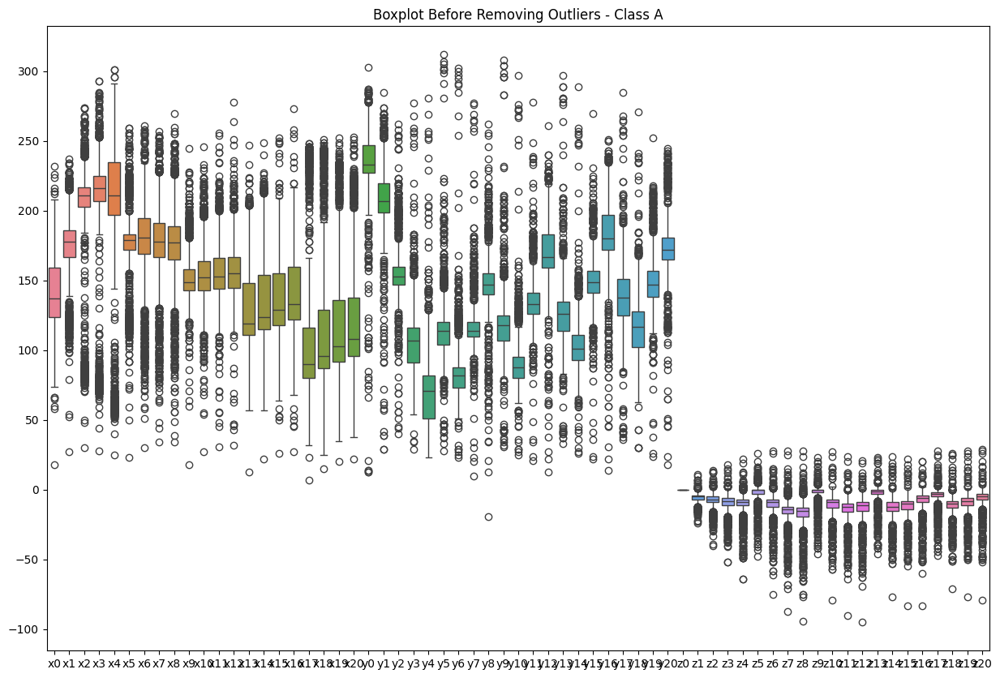

Number of eliment in A : 1419
Number of outliers in A : 284
Number of Non outliers in A : 1135


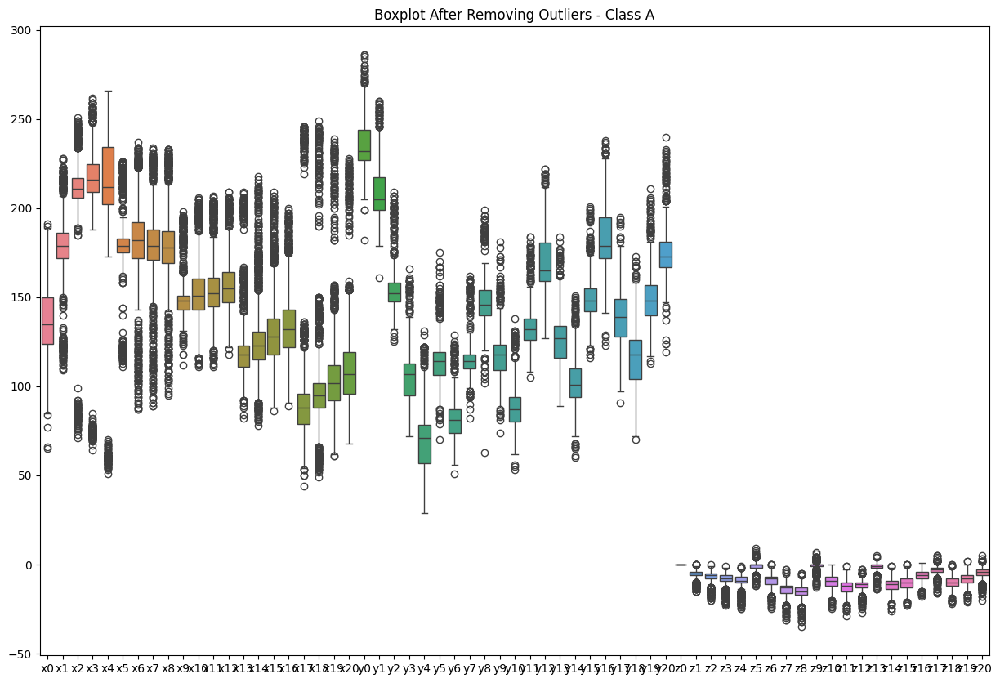

Processing class: O


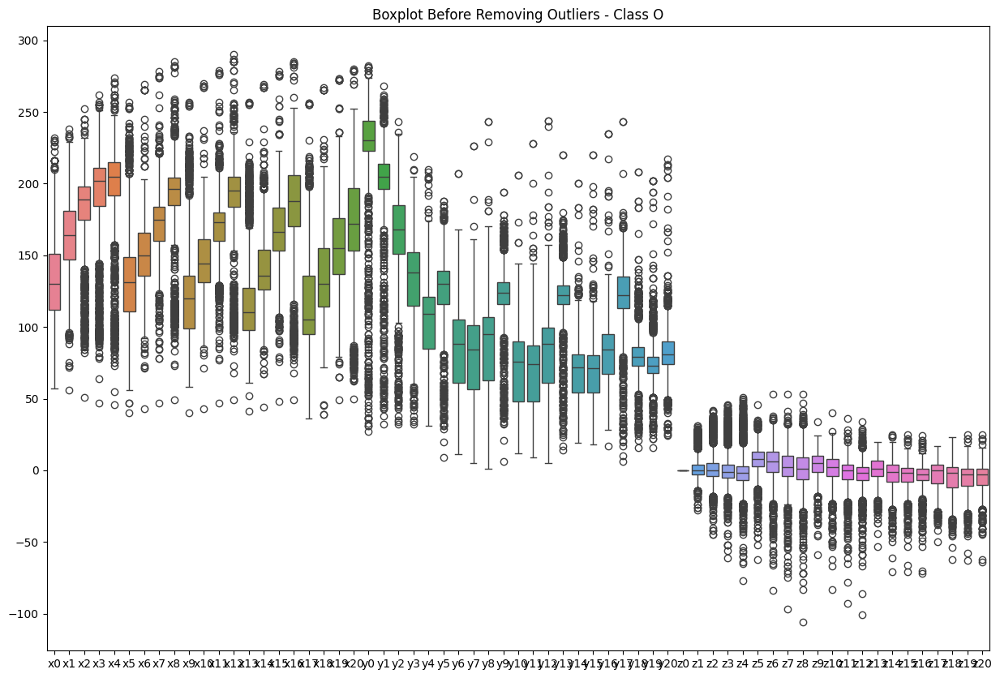

Number of eliment in O : 1386
Number of outliers in O : 276
Number of Non outliers in O : 1110


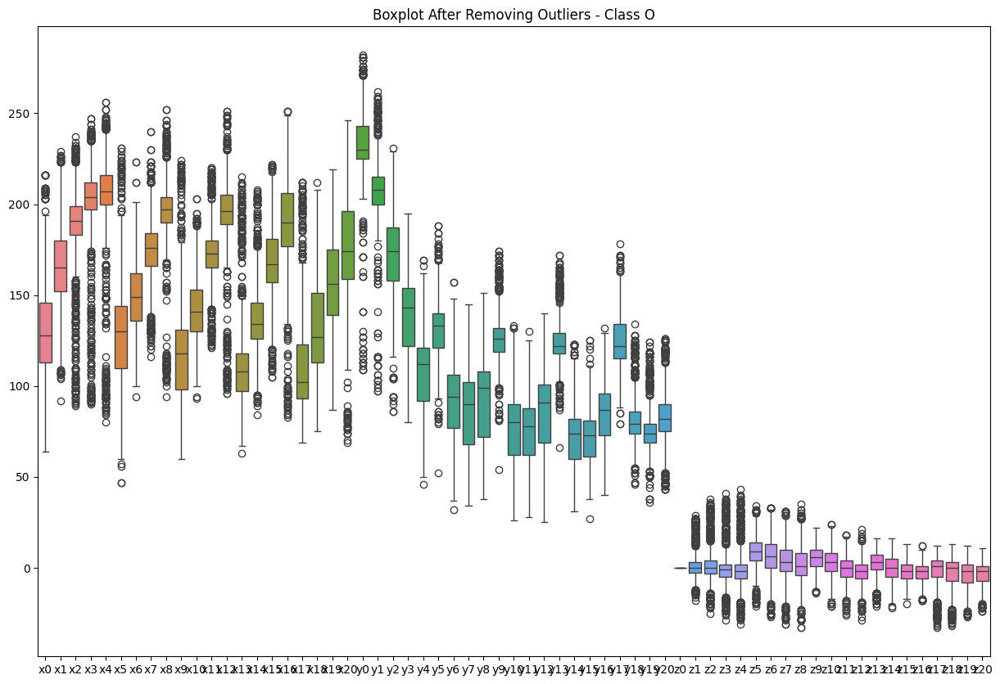

Processing class: T


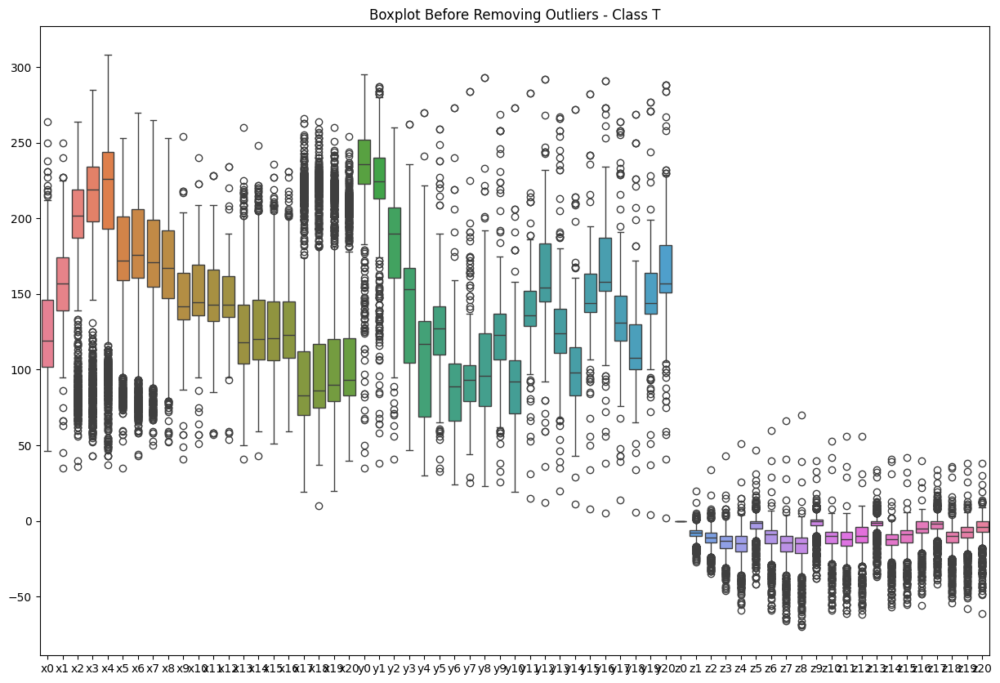

Number of eliment in T : 1476
Number of outliers in T : 294
Number of Non outliers in T : 1182


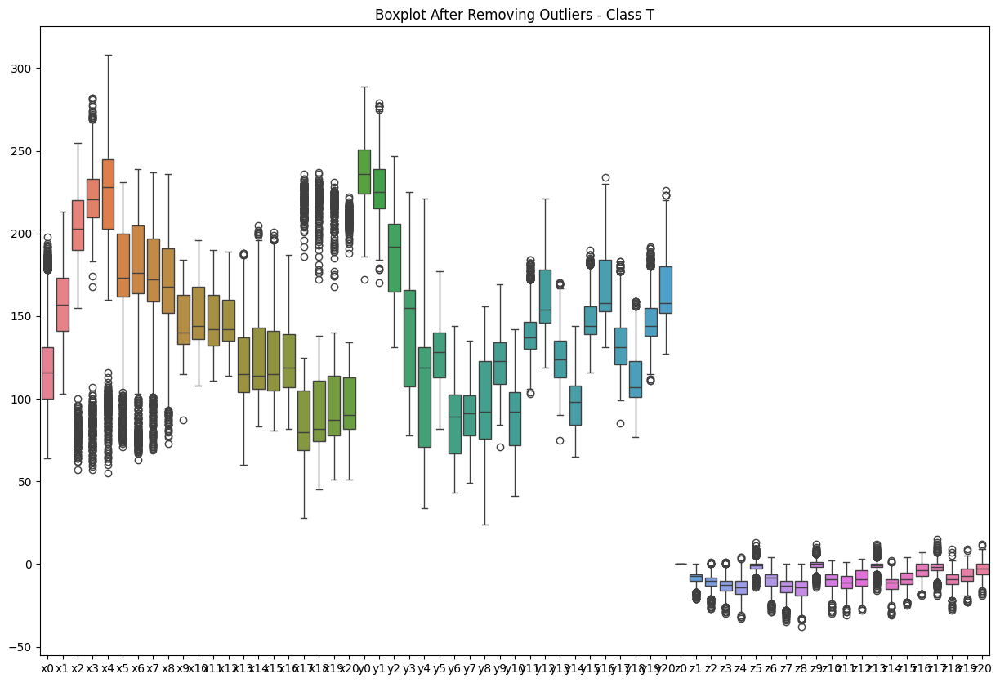

Processing class: V


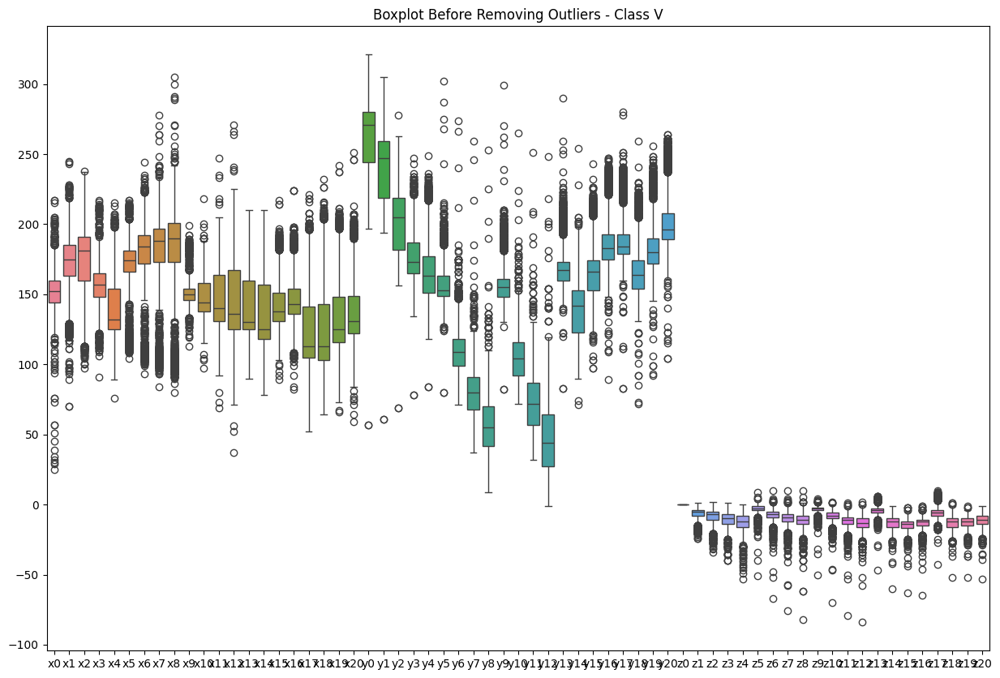

Number of eliment in V : 1581
Number of outliers in V : 316
Number of Non outliers in V : 1265


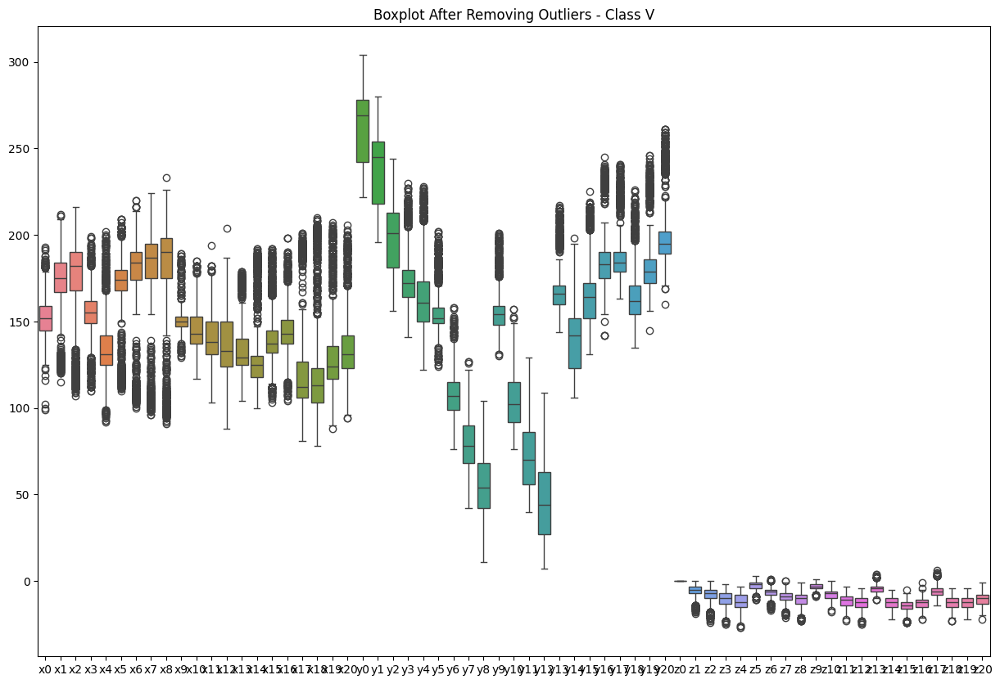

Processing class: Z


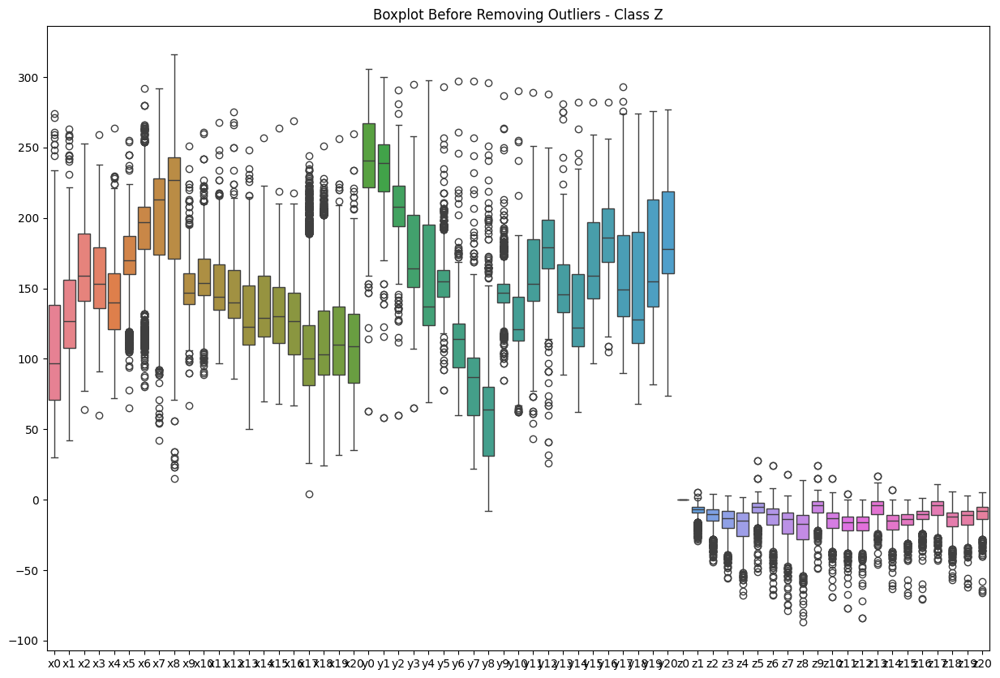

Number of eliment in Z : 1517
Number of outliers in Z : 303
Number of Non outliers in Z : 1214


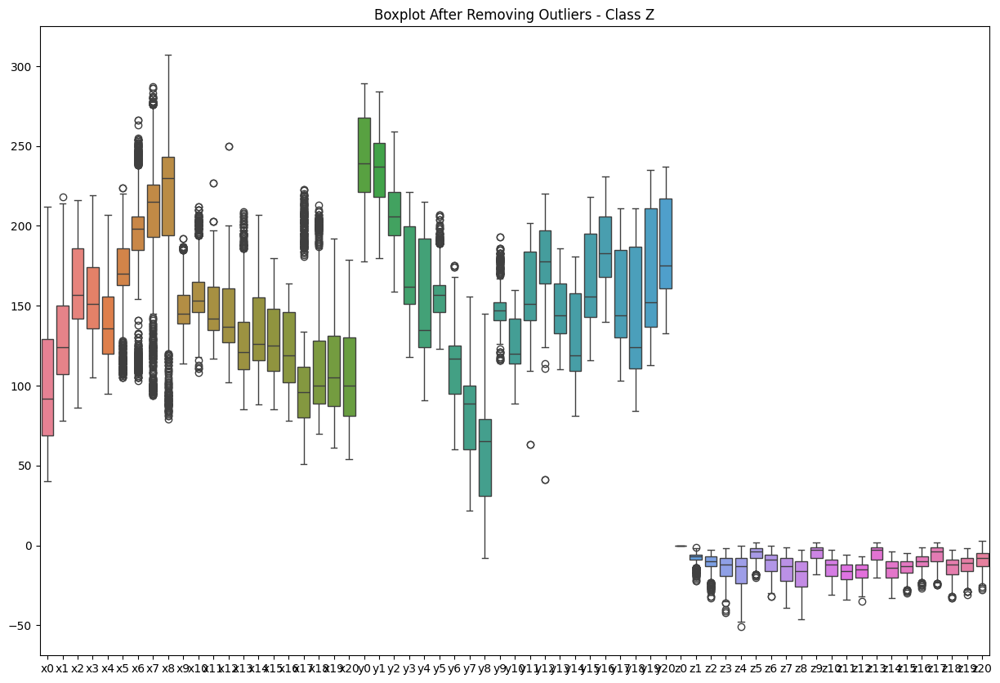

Processing class: C


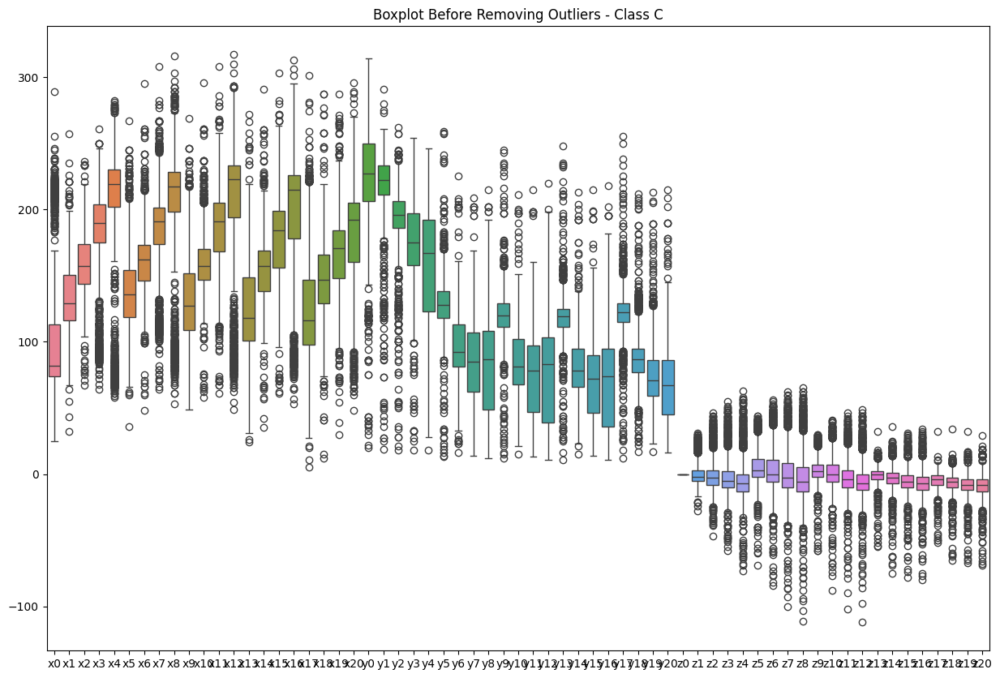

Number of eliment in C : 1567
Number of outliers in C : 313
Number of Non outliers in C : 1254


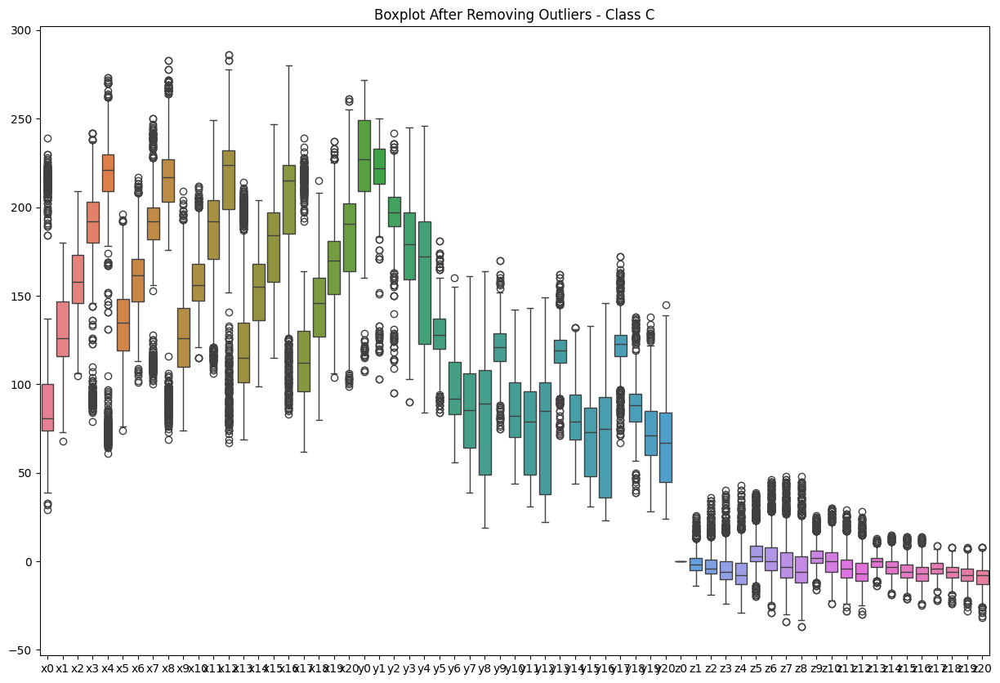

Processing class: P


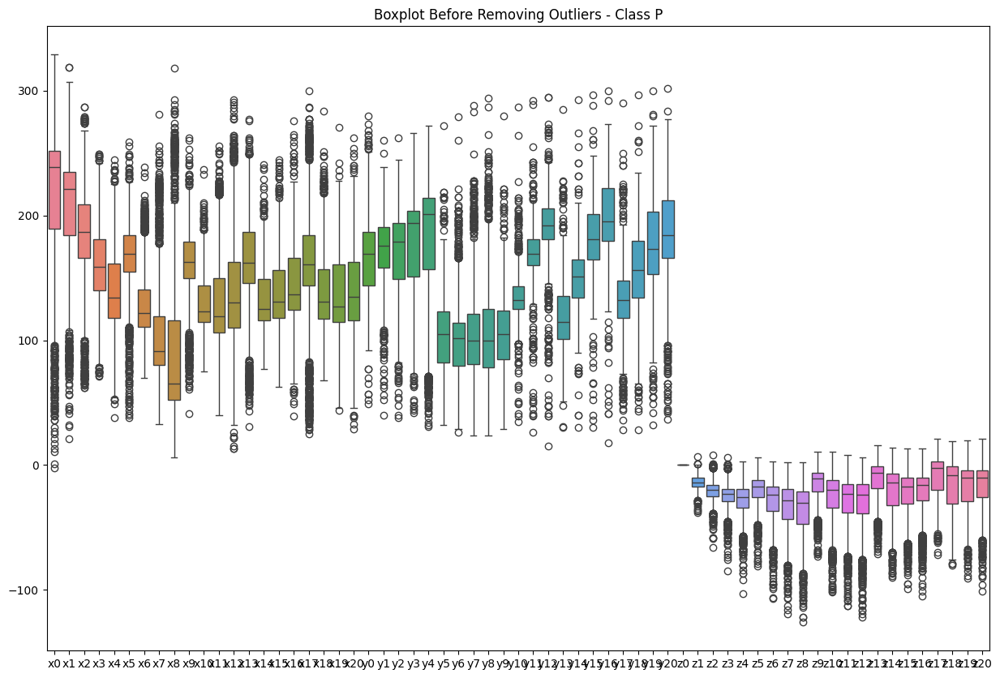

Number of eliment in P : 1476
Number of outliers in P : 295
Number of Non outliers in P : 1181


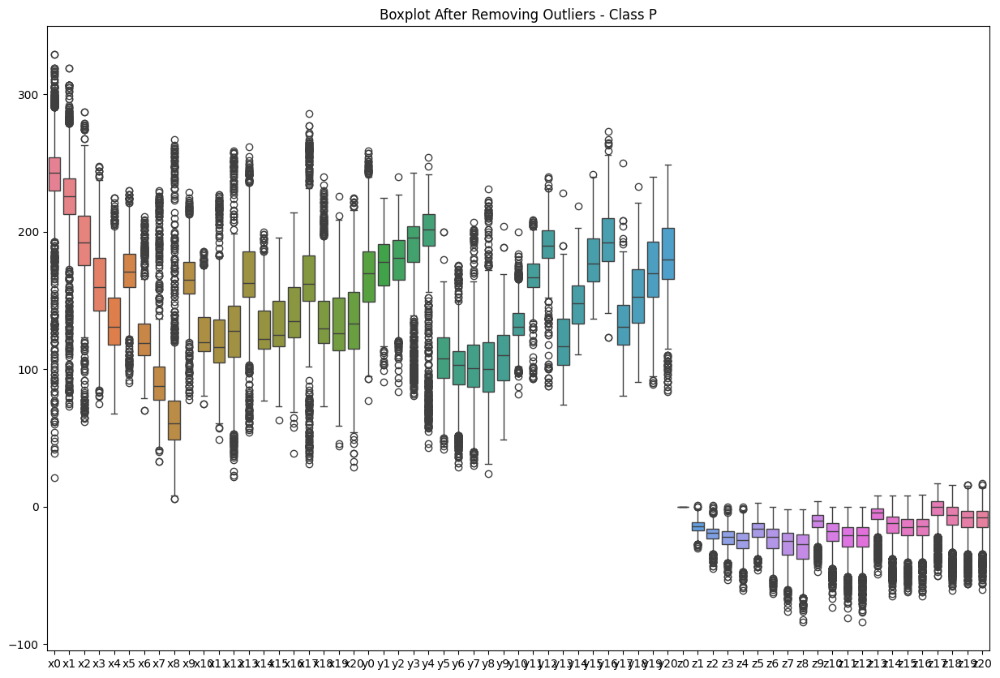

Processing class: L


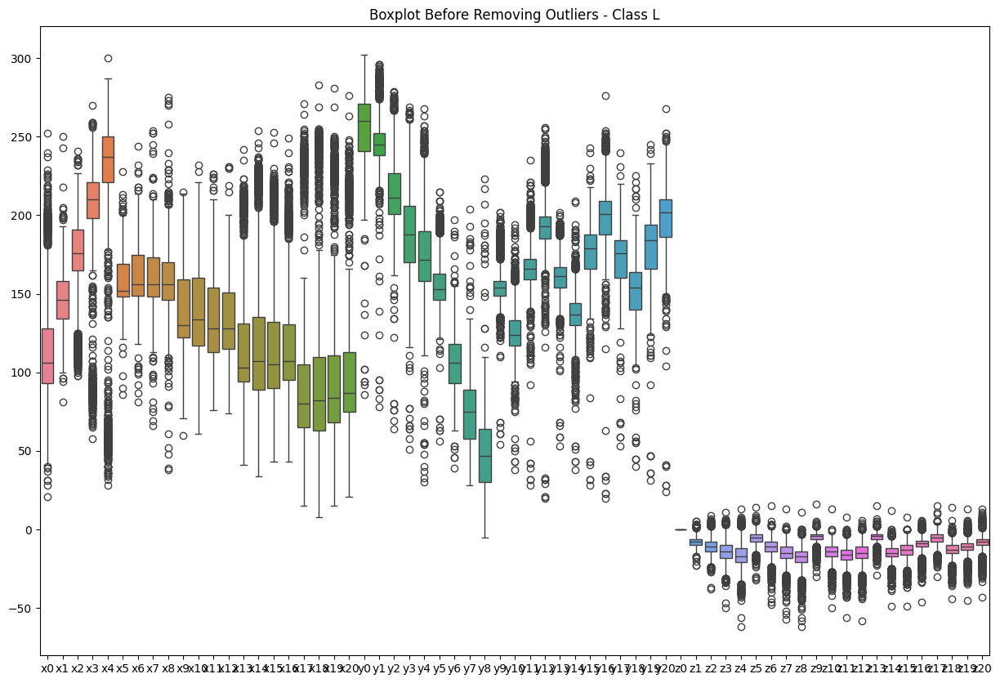

Number of eliment in L : 1590
Number of outliers in L : 318
Number of Non outliers in L : 1272


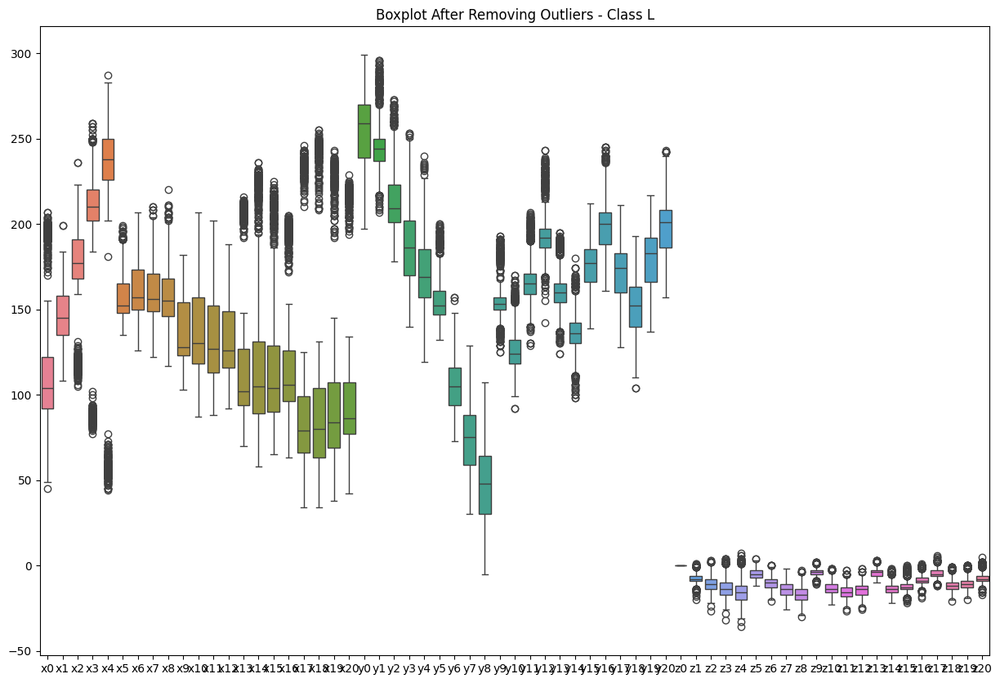

Processing class: W


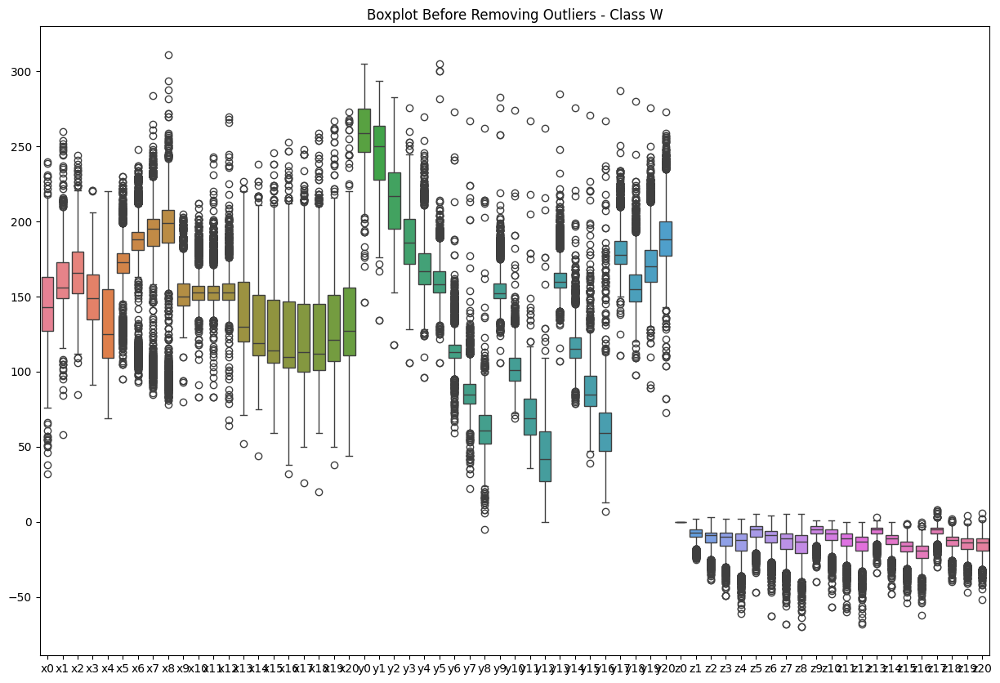

Number of eliment in W : 1579
Number of outliers in W : 316
Number of Non outliers in W : 1263


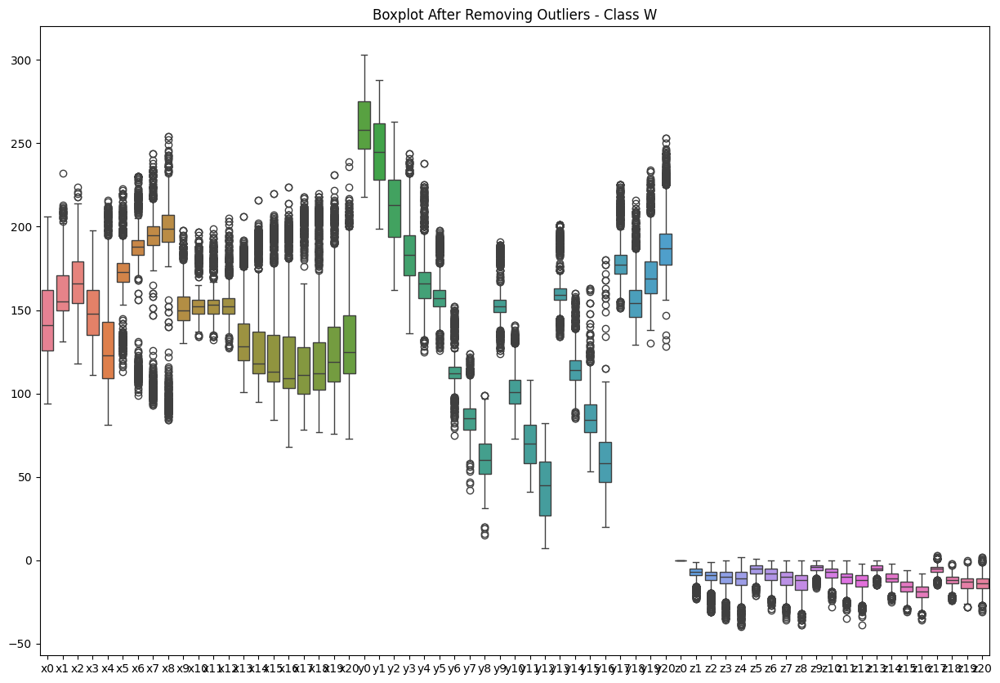

Processing class: D


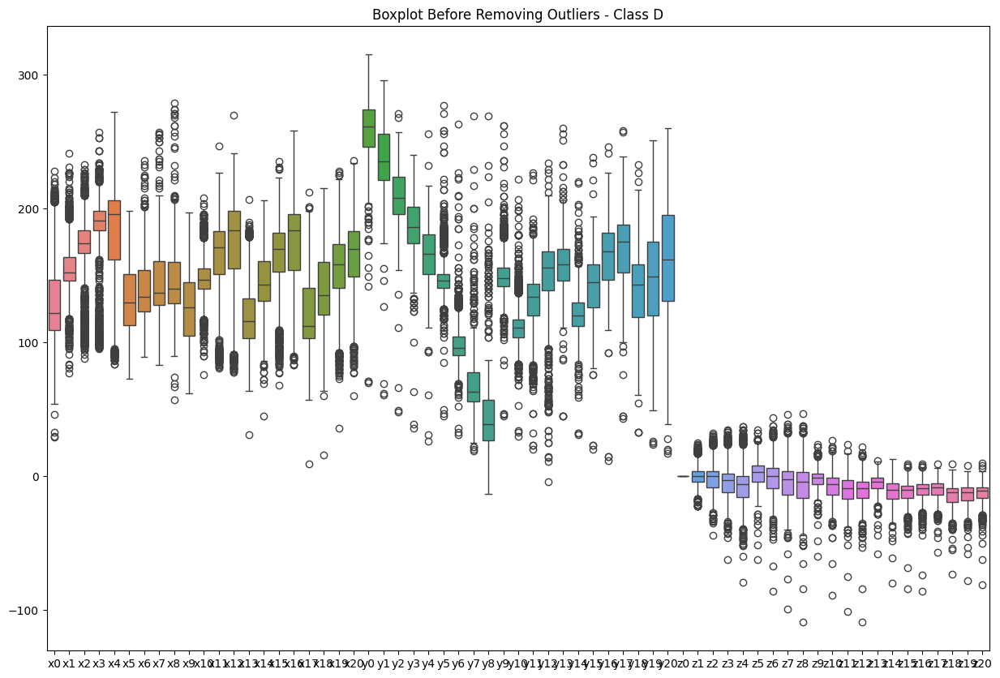

Number of eliment in D : 1571
Number of outliers in D : 314
Number of Non outliers in D : 1257


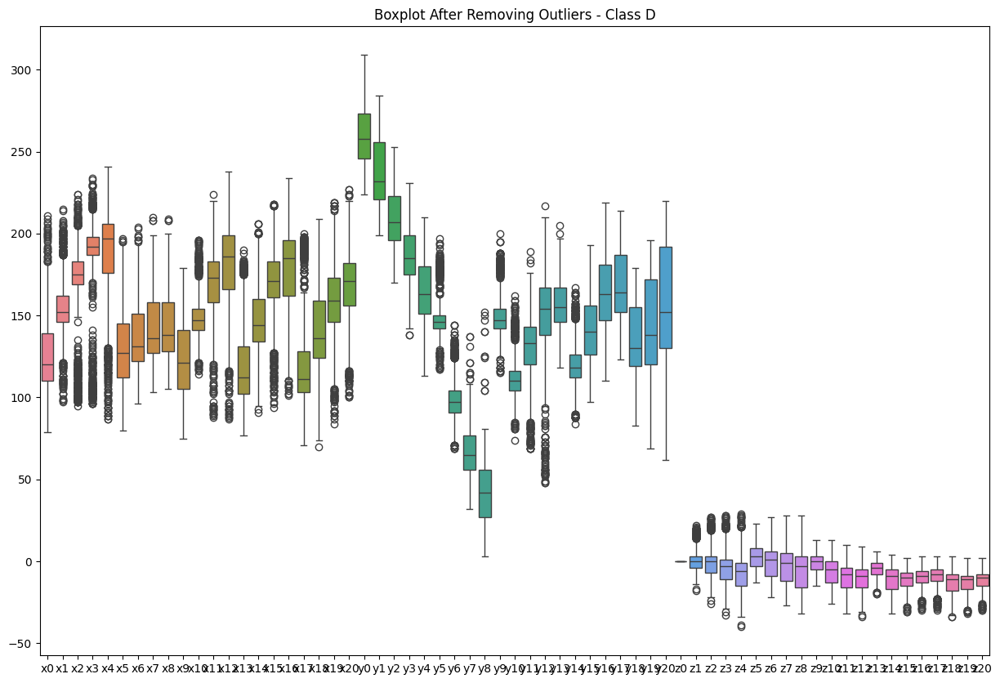

Processing class: J


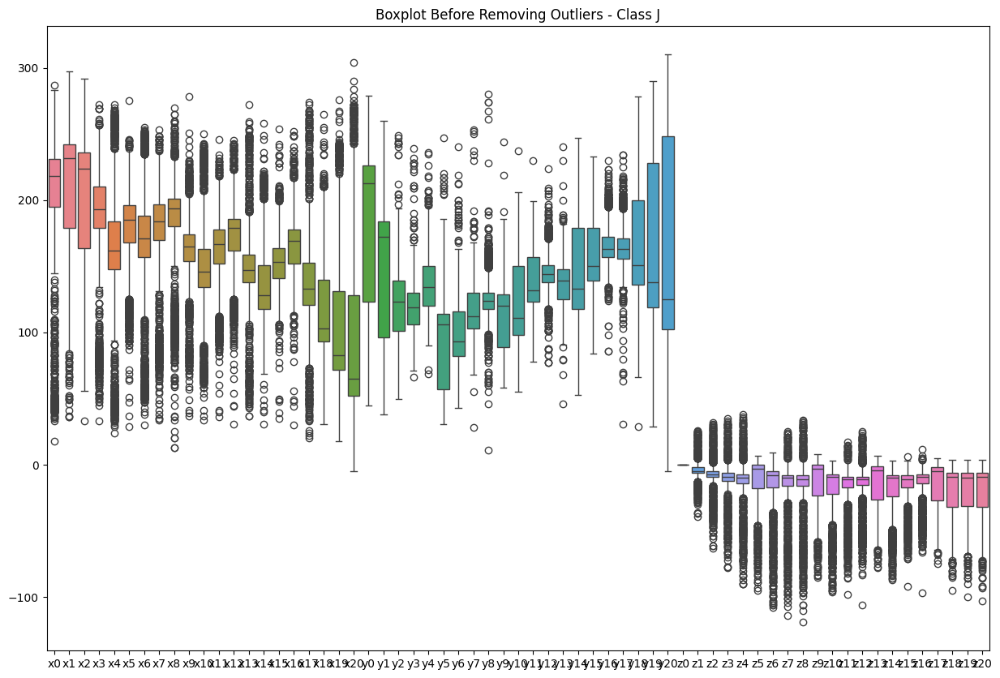

Number of eliment in J : 1570
Number of outliers in J : 314
Number of Non outliers in J : 1256


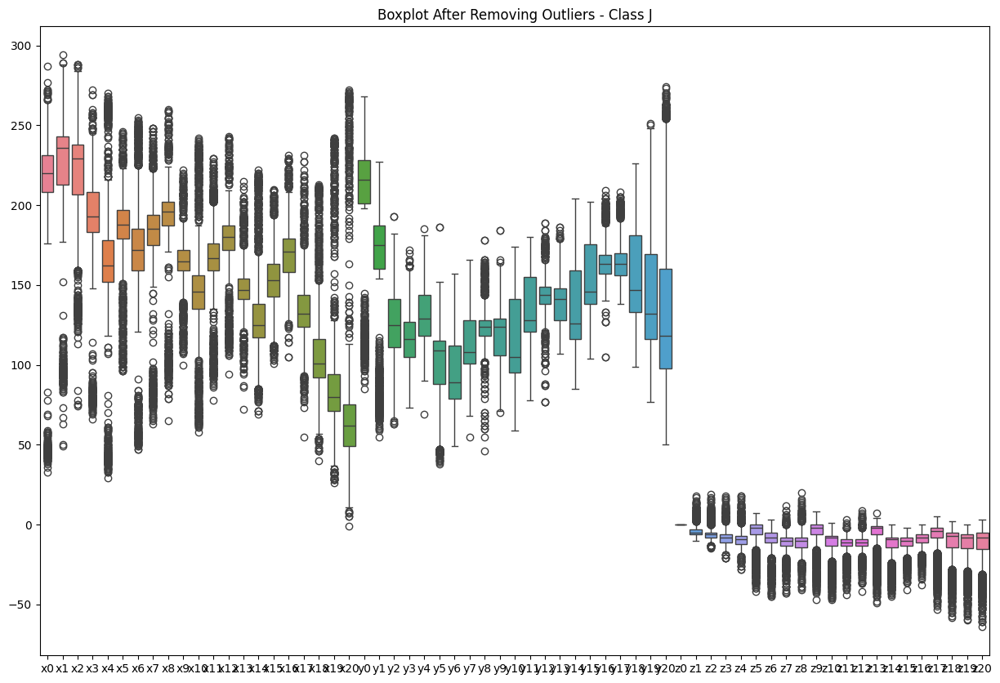

                  x0            x1            x2            x3            x4  \
count   33175.000000  33175.000000  33175.000000  33175.000000  33175.000000   
unique           NaN           NaN           NaN           NaN           NaN   
top              NaN           NaN           NaN           NaN           NaN   
freq             NaN           NaN           NaN           NaN           NaN   
mean      154.645034    174.160482    183.114996    175.520874    164.010158   
std        49.094333     40.769093     40.639858     41.006210     48.678045   
min        19.000000     38.000000     57.000000     45.000000     29.000000   
25%       126.000000    150.000000    167.000000    153.000000    132.000000   
50%       148.000000    176.000000    192.000000    179.000000    155.000000   
75%       177.000000    197.000000    210.000000    205.000000    203.000000   
max       329.000000    319.000000    288.000000    298.000000    308.000000   

                  x5            x6     

In [ ]:
outliers_ISO=main_exploratory(df)

## Decisions

* use the min_max scaler as the scaler
* use label encoding to encode the label
